In [1449]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits 
from astropy.io import fits
import dfitspy
import os
from astropy.visualization import simple_norm
from astropy.visualization import ZScaleInterval
import pandas as pd
from scipy.integrate import trapz
from scipy.optimize import curve_fit
import scipy.signal
from scipy.interpolate import UnivariateSpline
from scipy.interpolate import SmoothBivariateSpline
from scipy.signal import medfilt2d
from scipy.interpolate import UnivariateSpline
from scipy import signal
import tarfile
import matplotlib.cm as cm

In [1450]:
#DATA

In [1761]:
data='data'
listfiles=dfitspy.get_files(['all'], data)
fitsort = dfitspy.dfitsort(listfiles,listkeys=['OBJECT','EXPTIME','CTYPE1'], exact=True)
dfitspy.dfitsort_view(fitsort)

                    filename                     	 CTYPE1 	EXPTIME 	 OBJECT  
-------------------------------------------------	--------	--------	---------
CRIRE.2012-03-16T01:19:14.364.fits.flat_corr.fits	   -    	   -    	    -    
       CRIRE.2012-03-16T11:24:22.610.fits        	   -    	  3.0   	  FLAT   
CRIRE.2012-03-16T01:15:58.255.fits.flat_corr.fits	   -    	   -    	    -    
CRIRE.2012-03-16T01:20:11.498.fits.flat_corr.fits	   -    	   -    	    -    
       CRIRE.2012-03-16T11:22:46.910.fits        	   -    	  3.0   	  FLAT   
CRIRE.2012-03-16T00:32:38.850.fits.flat_corr.fits	   -    	   -    	    -    
CRIRE.2012-03-16T01:14:58.934.fits.flat_corr.fits	   -    	   -    	    -    
CRIRE.2012-03-16T00:25:52.974.fits.flat_corr.fits	   -    	   -    	    -    
       CRIRE.2012-03-16T14:08:08.407.fits        	   -    	  30.0  	WAVE,LAMP
       CRIRE.2012-03-16T01:28:59.651.fits        	   -    	   -    	    -    
       CRIRE.2012-03-16T01:13:45.758.fits        	   -    	  10.

In [1452]:
std = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS','EXPTIME'], grepping=['STD'])
#dfitspy.dfitsort_view(std)

In [1453]:
data = pd.DataFrame.from_dict(std, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
std_sorted = data.to_dict() 
#dfitspy.dfitsort_view(std_sorted)

In [1454]:
std_nodA_unsorted = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS'], grepping=['STD','A']) 

#sorting NOD A in order of observation time
data = pd.DataFrame.from_dict(std_nodA_unsorted, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
std_nodA = data.to_dict() 
dfitspy.dfitsort_view(std_nodA)

             filename             	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-----------------------	--------------	------
CRIRE.2012-03-16T01:12:46.338.fits	           A           	56002.05053632	 STD  
CRIRE.2012-03-16T01:13:45.758.fits	           A           	56002.05122405	 STD  
CRIRE.2012-03-16T01:19:14.364.fits	           A           	56002.05502736	 STD  
CRIRE.2012-03-16T01:20:11.498.fits	           A           	56002.05568864	 STD  
CRIRE.2012-03-16T01:28:02.498.fits	           A           	56002.06114002	 STD  


In [1455]:
std_nodB_unsorted = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS'], grepping=['STD','B']) 

#sorting NOD B in order of observation time
data = pd.DataFrame.from_dict(std_nodB_unsorted, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
std_nodB = data.to_dict() 
dfitspy.dfitsort_view(std_nodB)

             filename             	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-----------------------	--------------	------
CRIRE.2012-03-16T01:14:58.934.fits	           B           	 56002.052071 	 STD  
CRIRE.2012-03-16T01:15:58.255.fits	           B           	56002.05275758	 STD  
CRIRE.2012-03-16T01:16:55.274.fits	           B           	56002.05341752	 STD  
CRIRE.2012-03-16T01:17:52.693.fits	           B           	56002.0540821 	 STD  
CRIRE.2012-03-16T01:30:08.934.fits	           B           	56002.0626034 	 STD  
CRIRE.2012-03-16T01:31:03.819.fits	           B           	56002.06323865	 STD  


In [1456]:
list_std_nodA = list(std_nodA)
list_std_nodB = list(std_nodB)

In [1457]:
def masterflat(flats):

    flats_data = []

    for file_name in flats: #loop through the flats
        file_path = os.path.join("data", file_name)
        print(f"Data from: {file_path}")
        
        try:
            data = fits.getdata(file_path, ext=2)  # read the data from chip 2
            flats_data.append(data)
        except Exception as e:
            print(f"Data not avaiable from: {file_path}: {str(e)}")

    # Calculate the mean
    masterflat_1 = np.median(flats_data, axis=0)
    
    #normalization
    median_masterflat = np.median(masterflat_1)
    masterflat = masterflat_1 / median_masterflat
    np.save("Masterflat.npy",masterflat)

    return masterflat

In [1458]:
flats = dfitspy.dfitsort(listfiles, ['OBJECT'], grepping=['FLAT'])
dfitspy.dfitsort_view(flats)
print(len(flats))

flatlist = list(flats)

             filename             	OBJECT
----------------------------------	------
CRIRE.2012-03-16T11:24:22.610.fits	 FLAT 
CRIRE.2012-03-16T11:22:46.910.fits	 FLAT 
CRIRE.2012-03-16T11:21:13.041.fits	 FLAT 
3


Data from: data/CRIRE.2012-03-16T11:24:22.610.fits
Data from: data/CRIRE.2012-03-16T11:22:46.910.fits
Data from: data/CRIRE.2012-03-16T11:21:13.041.fits


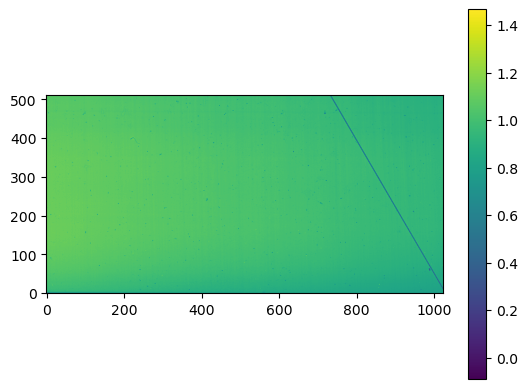

In [1459]:
masterflat = masterflat(flatlist)

plt.imshow(masterflat, origin='lower')
plt.colorbar()
plt.show()

In [1460]:
def ap_trace(img, fmask=(1,), nsteps=50, interac=False,
             recenter=False, prevtrace=(0,), bigbox=15,
             Saxis=1, display=False):
    """
    Trace the spectrum aperture in an image

    Assumes wavelength axis is along the X, spatial axis along the Y.
    Chops image up in bins along the wavelength direction, fits a Gaussian
    within each bin to determine the spatial center of the trace. Finally,
    draws a cubic spline through the bins to up-sample the trace.

    Parameters
    ----------
    img : 2d numpy array
        This is the image, stored as a normal numpy array. Can be read in
        using astropy.io.fits like so:

        >>> hdu = fits.open('file.fits')  # doctest: +SKIP
        >>> img = hdu[0].data  # doctest: +SKIP

    nsteps : int, optional
        Keyword, number of bins in X direction to chop image into. Use
        fewer bins if ap_trace is having difficulty, such as with faint
        targets (default is 50, minimum is 4)
    fmask : array-like, optional
        A list of illuminated rows in the spatial direction (Y), as
        returned by flatcombine.
    interac : bool, optional
        Set to True to have user click on the y-coord peak. (Default is
        False)
    recenter : bool, optional
        Set to True to use previous trace, but allow small shift in
        position. Currently only allows linear shift (Default is False)
    bigbox : float, optional
        The number of sigma away from the main aperture to allow to trace
    display : bool, optional
        If set to true display the trace over-plotted on the image
    Saxis : int, optional
        Set which axis the spatial dimension is along. 1 = Y axis, 0 = X.
        (Default is 1)

    Returns
    -------
    my : array
        The spatial (Y) positions of the trace, interpolated over the
        entire wavelength (X) axis
    """

    # define the wavelength axis
    Waxis = 0
    # add a switch in case the spatial/wavelength axis is swapped
    if Saxis == 0:
        Waxis = 1

    print('Tracing Aperture using nsteps='+str(nsteps))
    # the valid y-range of the chip
    if (len(fmask)>1):
        ydata = np.arange(img.shape[Waxis])[fmask]
    else:
        ydata = np.arange(img.shape[Waxis])

    # need at least 4 samples along the trace. sometimes can get away with very few
    if (nsteps<4):
        nsteps = 4

    # median smooth to crudely remove cosmic rays
    img_sm = scipy.signal.medfilt2d(img, kernel_size=(5,5))

    #--- Pick the strongest source, good if only 1 obj on slit
    ztot = img_sm.sum(axis=Saxis)[ydata]
    yi = np.arange(img.shape[Waxis])[ydata]
    peak_y = yi[np.nanargmax(ztot)]
    peak_guess = [np.nanmax(ztot), np.nanmedian(ztot), peak_y, 2.]

    #-- allow interactive mode, if mult obj on slit
    if interac is True and recenter is False:
        class InteracTrace(object):
            def __init__(self):
                self.fig = plt.figure()
                self.ax = self.fig.add_subplot(111)
                self.ax.plot(yi, ztot)
                plt.ylabel('Counts (Image summed in X direction)')
                plt.xlabel('Y Pixel')
                plt.title('Click on object!')

                self.cursor = Cursor(self.ax, useblit=False, horizOn=False,
                                     color='red', linewidth=1 )
                self.connect = self.fig.canvas.mpl_connect
                self.disconnect = self.fig.canvas.mpl_disconnect
                self.ClickID = self.connect('button_press_event', self.__onclick__)

                return

            def __onclick__(self,click):
                if self.fig.canvas.manager.toolbar._active is None:
                    self.xpoint = click.xdata
                    self.ypoint = click.ydata
                    self.disconnect(self.ClickID) # disconnect from event
                    self.cursor.disconnect_events()
                    self.cursor._update()
                    plt.close() # close window when clicked
                    return self.xpoint, self.ypoint
                else:
                    pass

        theclick = InteracTrace()
        plt.show()

        xcl = theclick.xpoint
        # ycl = theclick.ypoint

        peak_guess[2] = xcl

    #-- use middle of previous trace as starting guess
    if (recenter is True) and (len(prevtrace)>10):
        peak_guess[2] = np.nanmedian(prevtrace)

    #-- fit a Gaussian to peak
    popt_tot, pcov = curve_fit(_gaus, yi[np.isfinite(ztot)], ztot[np.isfinite(ztot)], p0=peak_guess)
    #-- only allow data within a box around this peak
    ydata2 = ydata[np.where((ydata>=popt_tot[2] - popt_tot[3]*bigbox) &
                            (ydata<=popt_tot[2] + popt_tot[3]*bigbox))]

    ztot = img_sm.sum(axis=Saxis)[ydata2]
    yi = np.arange(img.shape[Waxis])[ydata2]
    # define the X-bin edges
    xbins = np.linspace(0, img.shape[Saxis], nsteps, dtype='int')
    ybins = np.zeros_like(xbins, dtype='int')

    for i in range(0,len(xbins)-1):
        #-- fit gaussian w/i each window
        if Saxis == 1:
            zi = np.sum(img_sm[ydata2, xbins[i]:xbins[i+1]], axis=Saxis)
        else:
            zi = img_sm[xbins[i]:xbins[i+1], ydata2].sum(axis=Saxis)

        pguess = [np.nanmax(zi), np.nanmedian(zi), yi[np.nanargmax(zi)], 2.]
        popt,pcov = curve_fit(_gaus, yi[np.isfinite(ztot)], zi[np.isfinite(ztot)], p0=pguess)

        # if gaussian fits off chip, then use chip-integrated answer
        if (popt[2] <= min(ydata2)+25) or (popt[2] >= max(ydata2)-25):
            ybins[i] = popt_tot[2]
            popt = popt_tot
        else:
            ybins[i] = popt[2]

        # update the box it can search over, in case a big bend in the order
        # ydata2 = ydata[np.where((ydata>= popt[2] - popt[3]*bigbox) &
        #                         (ydata<= popt[2] + popt[3]*bigbox))]

    # recenter the bin positions, trim the unused bin off in Y
    mxbins = (xbins[:-1]+xbins[1:]) / 2.
    mybins = ybins[:-1]

    # run a cubic spline thru the bins
    ap_spl = UnivariateSpline(mxbins, mybins, ext=0, k=3, s=0)

    # interpolate the spline to 1 position per column
    mx = np.arange(0, img.shape[Saxis])
    my = ap_spl(mx)

    if display is True:
        plt.figure()
        plt.imshow(np.log10(img),origin='lower',aspect='auto',cmap=cm.Greys_r)
        plt.autoscale(False)
        plt.plot(mx,my,'b',lw=1)
        # plt.plot(mx,my+popt_tot[3]*bigbox,'y')
        # plt.plot(mx,my-popt_tot[3]*bigbox,'y')
        plt.show()

    #print("> Trace gaussian width = "+str(popt_tot[3])+' pixels')
    return my

In [1293]:
def ap_extract(img, trace, apwidth=4, skysep=3, skywidth=7, skydeg=0,
               coaddN=1):
    """
    1. Extract the spectrum using the trace. Simply add up all the flux
    around the aperture within a specified +/- width.

    Note: implicitly assumes wavelength axis is perfectly vertical within
    the trace. An major simplification at present. To be changed!

    2. Fits a polynomial to the sky at each column

    Note: implicitly assumes wavelength axis is perfectly vertical within
    the trace. An important simplification.

    3. Computes the uncertainty in each pixel

    Parameters
    ----------
    img : 2d numpy array
        This is the image, stored as a normal numpy array. Can be read in
        using astropy.io.fits like so:

        >>> hdu = fits.open('file.fits') # doctest: +SKIP
        >>> img = hdu[0].data # doctest: +SKIP

    trace : 1-d array
        The spatial positions (Y axis) corresponding to the center of the
        trace for every wavelength (X axis), as returned from ap_trace
    apwidth : int, optional
        The width along the Y axis on either side of the trace to extract.
        Note: a fixed width is used along the whole trace.
        (default is 8 pixels)
    skysep : int, optional
        The separation in pixels from the aperture to the sky window.
        (Default is 3)
    skywidth : int, optional
        The width in pixels of the sky windows on either side of the
        aperture. (Default is 7)
    skydeg : int, optional
        The polynomial order to fit between the sky windows.
        (Default is 0)

    Returns
    -------
    onedspec : 1-d array
        The summed flux at each column about the trace. Note: is not
        sky subtracted!
    skysubflux : 1-d array
        The integrated sky values along each column, suitable for
        subtracting from the output of ap_extract
    fluxerr : 1-d array
        the uncertainties of the flux values
    """

    onedspec_old = np.zeros_like(trace)
    skysubflux = np.zeros_like(trace)
    fluxerr = np.zeros_like(trace)
    onedspec = np.zeros_like(trace)

    for i in range(0,len(trace)):
        #-- first do the aperture flux
        # juuuust in case the trace gets too close to the edge
        widthup = apwidth
        widthdn = apwidth
        if (trace[i]+widthup > img.shape[0]):
            widthup = img.shape[0]-trace[i] - 1
        if (trace[i]-widthdn < 0):
            widthdn = trace[i] - 1

        # simply add up the total flux around the trace +/- width
        onedspec_old[i] = img[int(trace[i]-widthdn):int(trace[i]+widthup+1), i].sum()

        #-- now do the sky fit
        itrace = int(trace[i])
        y = np.append(np.arange(itrace-apwidth-skysep-skywidth, itrace-apwidth-skysep),
                      np.arange(itrace+apwidth+skysep+1, itrace+apwidth+skysep+skywidth+1))

        z = img[y,i]
        if (skydeg>0):
            # fit a polynomial to the sky in this column
            pfit = np.polyfit(y,z,skydeg)
            # define the aperture in this column
            ap = np.arange(trace[i]-apwidth, trace[i]+apwidth+1)
            # evaluate the polynomial across the aperture, and sum
            skysubflux[i] = np.sum(np.polyval(pfit, ap))
        elif (skydeg==0):
            skysubflux[i] = np.nanmedian(z)*(apwidth*2.0 + 1)

        #-- finally, compute the error in this pixel
        sigB = np.std(z) # stddev in the background data
        N_B = len(y) # number of bkgd pixels
        N_A = apwidth*2. + 1 # number of aperture pixels

        # based on aperture phot err description by F. Masci, Caltech:
        # http://wise2.ipac.caltech.edu/staff/fmasci/ApPhotUncert.pdf
        fluxerr[i] = np.sqrt(np.sum((onedspec[i]-skysubflux[i])/coaddN) +
                             (N_A + N_A**2. / N_B) * (sigB**2.))
        
        onedspec[i] = onedspec_old[i] - skysubflux[i]

    return onedspec, skysubflux, fluxerr

In [1294]:
def _gaus(x, a, b, x0, sigma): #a = amplitude , b = constant offset
    
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2)) + b

In [1295]:
def image_plot(image_data):
    fig, ax = plt.subplots()
    zscale = ZScaleInterval()
    zlims = zscale.get_limits(image_data)
    norm = simple_norm(image_data, min_cut=zlims[0], max_cut=zlims[1])
    im = plt.imshow(image_data, origin='lower', norm=norm)
    plt.colorbar(im);
    plt.show()

In [1296]:
def gaussian(x,  A, mu, sigma,d): 
    return (- A * np.exp((-(x - mu)**2) / (2 * sigma**2)) + d)

In [1297]:
def plot_gaussian(xdata, ydata):
    
    popt, pcov = curve_fit(gaussian, xdata, ydata, p0=[min(ydata), np.argmin(ydata), 1, np.mean(ydata)],maxfev=10000) 
    
    fit = gaussian(xdata,*popt)
    
    A, mu, sigma, d = popt
    
    plt.plot(xdata, ydata, label='Data')
    plt.plot(xdata, fit, label='Gaussian Fit')
    #print("plot gauss para:", popt)
    
    fwhm = 2 * np.sqrt(2 * np.log(2)) * sigma
    
    perr = np.sqrt(np.diag(pcov))

    plt.legend()
    plt.show()
    
    return mu, sigma, fwhm, d, perr

In [1298]:
def image_plot_lines(image_data, hline_value, vline_value):
    fig, ax = plt.subplots()
    zscale = ZScaleInterval()
    zlims = zscale.get_limits(image_data)
    norm = simple_norm(image_data, min_cut=zlims[0], max_cut=zlims[1])
    im = plt.imshow(image_data, origin='lower', norm=norm)
    ax.axhline(y=hline_value, color='r',linestyle='--')
    ax.axvline(x=vline_value, color='r',linestyle='--')
    plt.colorbar(im)
    plt.show()

In [1299]:
#FUNCTIONS

In [1721]:
def spec_onenod(list_A, list_B, masterflat):
    
    list_A_minus_B = []
    list_B_minus_A = []
    
    list_A_B_pos = []
    list_B_A_pos = []
    
    onedspec_list_AB = []
    onedspec_list_BA = []
    
    #AB_array = np.zeros((1024,5))
    #BA_array = np.zeros((1024,5))
    
    #list_A_B_outliers = []
    #list_B_A_outliers = []
    
    for i in range(len(list_A)):
        
    #GET THE DATA
        
        dataA = list_A[i]
        hdul1 = fits.open("data/"+dataA)
        nodA_array = hdul1[2].data
    
        dataB = list_B[i]
        hdul1 = fits.open("data/"+dataB)
        nodB_array = hdul1[2].data
        
    #FLAT CORRECTION
        
        nodA_flatc = nodA_array / masterflat
        nodB_flatc = nodB_array / masterflat
        
    #A - B & B - A
        
        A_minus_B = nodA_flatc - nodB_flatc
        B_minus_A = nodB_flatc - nodA_flatc
        
        list_A_minus_B.append(A_minus_B)
        list_B_minus_A.append(B_minus_A)
        
    for i in range(len(list_A_minus_B)):
    
    #ONLY GET THE POSITIVE PART
    
        A_minus_B = list_A_minus_B[i]
        A_B_pos = A_minus_B[180:280,]
        list_A_B_pos.append(A_B_pos)
        
        B_minus_A = list_B_minus_A[i]
        B_A_pos = B_minus_A[300:400,]
        list_B_A_pos.append(B_A_pos)

    for i in range(len(list_A_B_pos)):
    
        trace_list_AB = []
        trace_AB = ap_trace(img=list_A_B_pos[i], nsteps=5) #list_A_B_pos[i]
        trace_list_AB.append(trace_AB)
        
        trace_list_BA = []
        trace_BA = ap_trace(img=list_B_A_pos[i], nsteps=5)
        trace_list_BA.append(trace_BA)
    
    
        onedspec_AB, skysubflux_AB, fluxerr_AB = ap_extract(img=list_A_B_pos[i], trace=trace_AB, 
                                                                   skysep=6, skywidth=7, skydeg=0, coaddN=1)
    
        onedspec_BA, skysubflux_BA, fluxerr_BA = ap_extract(img=list_B_A_pos[i], trace=trace_BA, 
                                                                   skysep=6, skywidth=7, skydeg=0, coaddN=1,)
    
        onedspec_bgk_sub_AB = onedspec_AB - skysubflux_AB #this i put into the ap_extract function
        onedspec_bgk_sub_BA = onedspec_BA - skysubflux_BA
    
    
        onedspec_list_AB.append(onedspec_AB)
        onedspec_list_BA.append(onedspec_BA)
        
        #AB_array[i,:] = onedspec_bgk_sub_AB[i]
        #BA_array[i,:] = onedspec_bgk_sub_BA[i]
        
    #for i in range(len(onedspec_list_AB[i])):
     #   median_spec_AB = np.median(AB_array[:,i])
     #   return median_spec_AB
    
    #for i in range(len(onedspec_list_BA[i])):
    #    median_spec_BA = np.median(BA_array[:,i])
    #    return median_spec_BA
        

    onedspec_all_nodA = np.median(onedspec_list_AB, axis=0)   
    onedspec_all_nodB = np.median(onedspec_list_BA, axis=0) 
    
    normalized_nod_A = onedspec_all_nodA / np.median(onedspec_all_nodA)
    normalized_nod_B = onedspec_all_nodB / np.median(onedspec_all_nodB)
    
    #if i in range(len(normalized_nod_A)
    
    #A_outliers = np.where(normalized_nod_A > 0.5) & (normalized_nod_A < 1.50)[0]
    #B_outliers = np.where(normalized_nod_B > 0.5) & (normalized_nod_B < 1.50)[0]

    #list_A_B_outliers.append(A_outliers)
    #list_B_A_outliers.append(B_outliers)
    
    valid_indices_A = [i for i in range(len(normalized_nod_A)) if 0.5 < normalized_nod_A[i] < 1.5]
    valid_indices_B = [i for i in range(len(normalized_nod_B)) if 0.5 < normalized_nod_B[i] < 1.5]
    
    #filtered_normalized_nod_A = normalized_nod_A[(normalized_nod_A > 0.5) & (normalized_nod_A < 1.50)]
    #filtered_normalized_nod_B = normalized_nod_B[(normalized_nod_B > 0.5) & (normalized_nod_B < 1.50)]
    
    f_normalized_nod_A = normalized_nod_A[valid_indices_A]
    f_normalized_nod_B = normalized_nod_B[valid_indices_B]
    
    plt.figure(figsize = (20,6))
    #plt.ylim(0,2)
    #plt.plot(filtered_normalized_nod_A, color='r')  # Exclude outliers
    #plt.plot(filtered_normalized_nod_B, color='b')
    plt.plot(normalized_nod_A[valid_indices_A], color='r')
    plt.plot(normalized_nod_B[valid_indices_B], color='b')
    plt.title("1D spectrum positiv - Nod A in RED - Nod B in BLUE")
    plt.show()
    
    #x_values_A_outliers = []
    #for idx in A_outliers:
    #    x_values_A_outliers.append(idx + 180)  # Assuming the range starts from index 180

    #x_values_B_outliers = []
    #for idx in B_outliers:
    #    x_values_B_outliers.append(idx + 300) # Assuming the range starts from index 300

    return f_normalized_nod_A, f_normalized_nod_B, normalized_nod_A, normalized_nod_B

Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5


/var/folders/2x/jt01c38n3ybgl1tttphvrwhr0000gn/T/ipykernel_16484/4028309627.py:96: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.sum((onedspec[i]-skysubflux[i])/coaddN) +


Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5
Tracing Aperture using nsteps=5


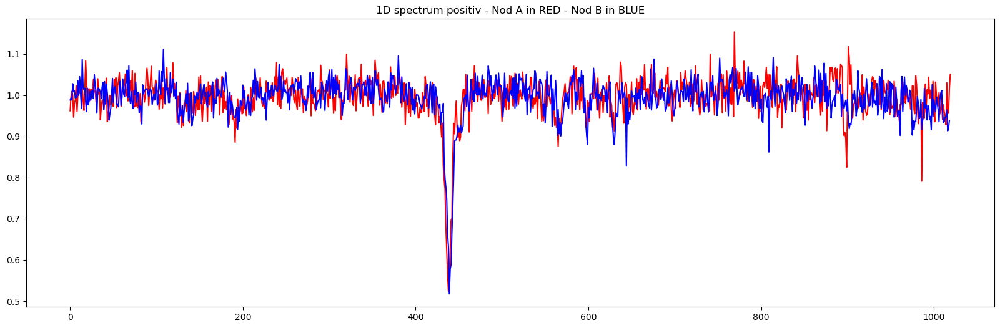

In [1722]:
f_normalized_nod_A, f_normalized_nod_B, normalized_nod_A, normalized_nod_B = spec_onenod(list_std_nodA,list_std_nodB,masterflat)

In [1302]:
#get the x-values in an array
pixel_nodA = np.arange(len(f_normalized_nod_A))
pixel_nodB = np.arange(len(f_normalized_nod_B))

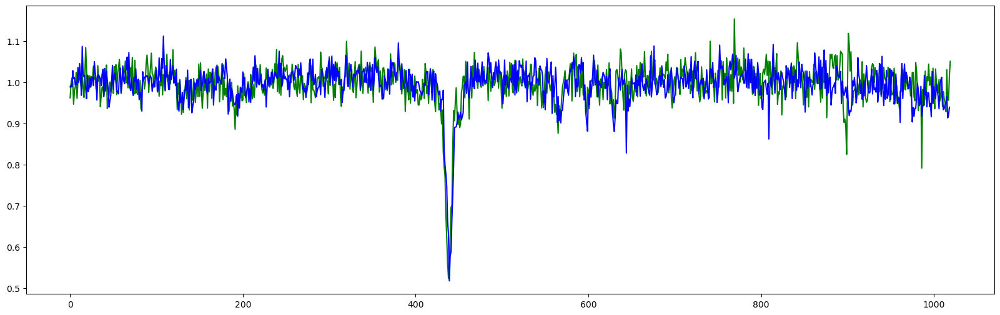

In [1723]:
plt.figure(figsize=(20,6))
plt.plot(pixel_nodA, f_normalized_nod_A, color='g')
plt.plot(pixel_nodB, f_normalized_nod_B, color='b')

In [1304]:
#covert A und B very simply to wavelength to find same peaks to use in plot

#START WAVELENGTH 2114.406
#END WAVELENGTH 2124.118
start_nm = 2114.406
end_nm = 2124.118

nm_length = 2124.118 - 2114.406
pixel_length = 1024
nm_per_pixel = nm_length / pixel_length
print(nm_per_pixel, "nm for 1 pixel - we have this in nm")

pixel_per_nm = pixel_length / nm_length
print(pixel_per_nm, "pixel for 1 nm - we have this many pixel")

nm_nodA = pixel_nodA * nm_per_pixel + start_nm
nm_nodB = pixel_nodB * nm_per_pixel + start_nm

0.00948437499999999 nm for 1 pixel - we have this in nm
105.4365733113675 pixel for 1 nm - we have this many pixel


In [1305]:
#spirou data

In [1306]:
tar_name = 'CHICAP.tar'
s_fits = []

# Extract and load all FITS files
with tarfile.open(tar_name, 'r') as tar:
    tarlist = tar.getmembers()
    print(tarlist)

    for member in tarlist:
        if member.name.endswith('.fits'):
            tar.extract(member)
            fits_file = fits.open(member.name)
            s_fits.append(fits_file)

[<TarInfo 'CHICAP' at 0x150b36b00>, <TarInfo 'CHICAP/2630639o_pp_s1d_w_AB.fits' at 0x150b368c0>, <TarInfo 'CHICAP/2664221o_pp_s1d_w_AB.fits' at 0x150b36980>, <TarInfo 'CHICAP/2623401o_pp_s1d_w_AB.fits' at 0x150b36800>, <TarInfo 'CHICAP/2499444o_pp_s1d_w_AB.fits' at 0x150b36bc0>, <TarInfo 'CHICAP/2810570o_pp_s1d_w_AB.fits' at 0x150b36c80>, <TarInfo 'CHICAP/2425962o_pp_s1d_w_AB.fits' at 0x150b36d40>, <TarInfo 'CHICAP/2882408o_pp_s1d_w_AB.fits' at 0x150b36e00>, <TarInfo 'CHICAP/2900067o_pp_s1d_w_AB.fits' at 0x150b36ec0>, <TarInfo 'CHICAP/2619262o_pp_s1d_w_AB.fits' at 0x150b36f80>, <TarInfo 'CHICAP/2620311o_pp_s1d_w_AB.fits' at 0x150b37040>, <TarInfo 'CHICAP/2519221o_pp_s1d_w_AB.fits' at 0x150b37100>, <TarInfo 'CHICAP/2636995o_pp_s1d_w_AB.fits' at 0x150b371c0>, <TarInfo 'CHICAP/2492464o_pp_s1d_w_AB.fits' at 0x150b37280>, <TarInfo 'CHICAP/2663284o_pp_s1d_w_AB.fits' at 0x150b37340>, <TarInfo 'CHICAP/2921732o_pp_s1d_w_AB.fits' at 0x150b37400>, <TarInfo 'CHICAP/2516128o_pp_s1d_w_AB.fits' at 0x

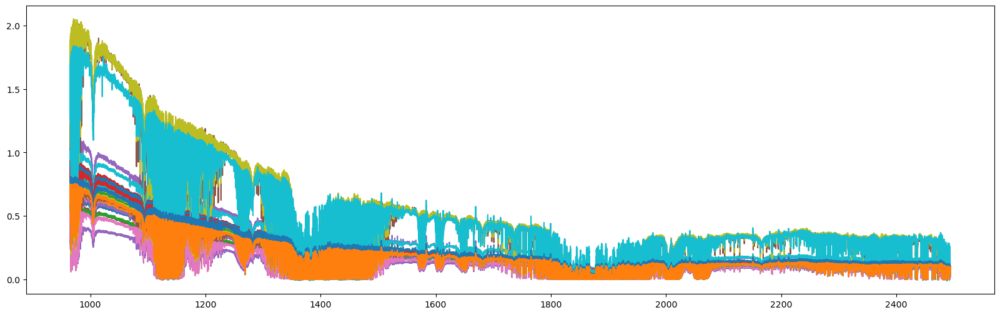

In [1307]:
plt.figure(figsize=(20, 6))
wavelengths = None
fluxes = []

for fits_file in s_fits:
    spectrum_data = fits_file[1].data  
    wavelength = spectrum_data['Wavelength']
    flux = spectrum_data['Flux']
    
    if wavelengths is None:
        wavelengths = wavelength 
    else:
        assert np.array_equal(wavelengths, wavelength), "Wavelength arrays are not equal!"
    
    fluxes.append(flux) 
    plt.plot(wavelength, flux)

#plt.xlabel('WAVELENGTH')
#plt.ylabel('FLUX')
#plt.title('ALL 52 SPECTRA')
#plt.xlim(2114,2124)
#plt.show()

summed_flux = np.sum(fluxes, axis=0)

#plt.plot(wavelengths, summed_flux)
#plt.xlabel('WAVELENGTH')
#plt.ylabel('FLUX SUMMED UP')
#plt.show()

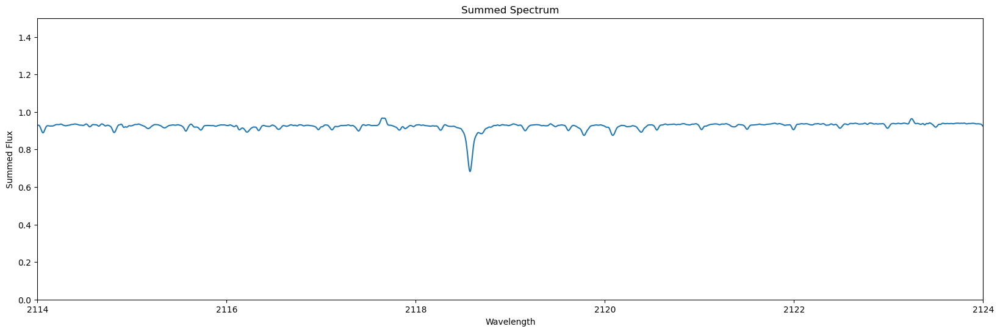

In [1308]:
summed_flux = np.sum(fluxes, axis=0)
normalized = summed_flux / np.nanmedian(summed_flux)

plt.figure(figsize=(20, 6))
plt.plot(wavelengths, normalized)
plt.xlim(2114,2124)
plt.ylim(0,1.5)
plt.xlabel('Wavelength')
plt.ylabel('Summed Flux')
plt.title('Summed Spectrum')
plt.show()

In [1309]:
#cut the spirou spectra only from start_nm to end_nm

mask=(wavelength > start_nm) & (wavelength < end_nm)

cut_lambda=wavelength[mask]
print(len(cut_lambda))

cut_flux=normalized[mask]
print(np.median(cut_flux))

spirou = cut_flux / np.median(cut_flux) #normalize it

#x values spirou: cut_lambda
#y values spirou: spirou

#x values spirou full: wavelength
#y values spirou full: normalized

1942
0.9285134410362093


In [1310]:
#function that finds the centre of the gaussian of 2 spectra

In [1317]:
def centre_find_crires(intervall,normalized_nod_A,normalized_nodB):
    
    
    #----------define the intervals for the gaussian fit--------------------
    peak_a = normalized_nod_A[intervall[0]:intervall[1]]
    xdata_peak_a = np.arange(len(peak_a))
    
    peak_b = normalized_nod_B[intervall[0]:intervall[1]]
    xdata_peak_b = np.arange(len(peak_b))
    
    
    #-----------plot data and fit gaussian---------------------------
    plt.plot(xdata_peak_a, peak_a)
    mu_a, sigma_a, fwhm_a, d_a, perr_a = plot_gaussian(xdata_peak_a,peak_a)

    plt.plot(xdata_peak_b, peak_b)
    mu_b, sigma_b, fwhm_b, d_b, perr_b = plot_gaussian(xdata_peak_b,peak_b)

    
    #-----------print the results-----------------------------------
    print("Peak Crires NOD A :")
    print("Mu NOD A:", mu_a)
    error_a = perr_a[1]
    print("Error of Mu NOD A:", perr_a[1])
    
    print("Peak Crires NOD B :")
    print("Mu NOD B:", mu_b)
    error_b = perr_b[1]
    print("Error of Mu NOD B :", perr_b[1])

    centre_peaka_pixel_c = intervall[0] + mu_a
    print("Centre of Peak (Crires NOD A) in pixel:", centre_peaka_pixel_c)
    
    centre_peakb_pixel_c = intervall[0] + mu_b
    print("Centre of Peak (Crires NOD B) in pixel:", centre_peakb_pixel_c)
     
    
    #-----------very simply guess for wavelength intervall for spirou---------
    centre_guess_nm = centre_peaka_pixel_c * nm_per_pixel + start_nm
    print("Centre of Peak guess (Crires NOD A) in nm:", centre_guess_nm)
    
    return centre_peaka_pixel_c, centre_peakb_pixel_c, centre_guess_nm, error_a, error_b

In [1318]:
#function that fits gaussian to intervalls for spirou

In [1319]:
def centre_find_spirou(intervall,xdata,ydata):
    
    #cut the spiral spectra from a guess from simple nm crires calc
    mask=(xdata > intervall[0]) & (xdata < intervall[1])
    cut_lambda=xdata[mask]
    #print(len(cut_lambda))
    #print(cut_lambda)

    #make array so gaussian can fit to index that start at 0
    xxx = np.arange(len(cut_lambda))

    #cut the ydata at the same points
    cut_flux=ydata[mask]
    spirou = cut_flux / np.median(cut_flux)

    #fit the gaussian
    mus, sigmas, fwhms, ds, perrs = plot_gaussian(xxx, spirou)

    #print(mus) #mu in index of cut
    #print(cut_lambda[int(mus)]) #get corresponding wavelength
    centre_nm_peak_s = cut_lambda[int(mus)] 

    print("Peak Spirou:")
    print("Mu as index of cut:", mus)
    error_s = perrs[1]
    print("Error of Mu as index:", perrs[1])
    print("Centre of Peak Spirou in nm:", centre_nm_peak_s)
    
    return centre_nm_peak_s, error_s

In [1320]:
def wave_cali(intervalls_crires,nod_AA,nod_BB,xdata_s,ydata_s):
    
    centre_peaka_pixel_c = []
    centre_peakb_pixel_c = []
    guess =  []
    interval_s = []
    centre_peak_nm_spirou = []
    error_a = []
    error_b = []
    error_s = []
    
    #run the centre find for crires and get a guess for the wavelength intervall for spirou
    for i in range(len(intervalls_crires)):
        interval1 = intervalls_crires[i]
        aa, bb, guess1, error_aa, error_bb = centre_find_crires(interval1,nod_AA,nod_BB)
        centre_peaka_pixel_c.append(aa)
        centre_peakb_pixel_c.append(bb)
        guess.append(guess1)
        error_a.append(error_aa)
        error_b.append(error_bb)
        
    #print to see if values are ok
    #print(centre_peaka_pixel_c)
    #print(centre_peakb_pixel_c)
    #print(guess)
    
    #get the intervals for spirou from a wavelength guess from crires
    for i in range(len(guess)):
        inter1 = guess[i] - 0.3
        inter2 = guess[i] + 0.3
        inter = np.array((inter1,inter2))
        interval_s.append(inter)
        
    #run the centre find for spirou
    for i in range(len(interval_s)):
        interval = interval_s[i]
        ss, error_s1 = centre_find_spirou(interval,xdata_s,ydata_s)
        centre_peak_nm_spirou.append(ss)
        error_s.append(error_s1)
        
    #print(centre_peak_nm_spirou)
    
    #wavelength - pixel plot + errors
    
    plt.figure(figsize=(10,8))
    #plt.scatter(centre_peaka_pixel_c,centre_peak_nm_spirou,color="r")
    #plt.scatter(centre_peakb_pixel_c,centre_peak_nm_spirou,color="orange")

    x_fit_A = np.arange(len(nod_AA))
    fit_A,cov = np.polyfit(centre_peaka_pixel_c, centre_peak_nm_spirou,2, cov = True)
    p_A = np.poly1d(fit_A)
    
    x_fit_B = np.arange(len(nod_BB))
    fit_B,cov_B  = np.polyfit(centre_peakb_pixel_c, centre_peak_nm_spirou,2, cov = True)
    p_B = np.poly1d(fit_B)
    
    plt.plot(x_fit_A,p_A(x_fit_A),label='polyfit nod A (deg 2)')
    plt.scatter(centre_peaka_pixel_c,centre_peak_nm_spirou,color="r",label='gauss centre points NOD A')
    
    plt.plot(x_fit_B,p_B(x_fit_B),label='polyfit nod B (deg 2)')
    plt.scatter(centre_peakb_pixel_c,centre_peak_nm_spirou,color="orange",label='gauss centre points NOD B')
    
    plt.xlabel('PIXEL CRIRES')
    plt.ylabel('WAVELENGTH SPIROU')
    plt.title('PIXEL - WAVELENGTH RELATION')
    plt.legend()
    print('polyfit function for NOD A:',p_A)
    print('error of the fit function for NOD A:',np.sqrt(np.diag(cov)))

    print('polyfit function for NOD B:',p_B)
    print('error of the fit function for NOD B:',np.sqrt(np.diag(cov_B)))
    
    plt.errorbar(centre_peaka_pixel_c,centre_peak_nm_spirou,xerr=error_a, yerr=error_s, fmt='o')
    plt.errorbar(centre_peakb_pixel_c,centre_peak_nm_spirou,xerr=error_b, yerr=error_s, fmt='o')
    print('errors of gaussian peaks nod a:',error_a)
    print('errors of gaussian peaks nod b:',error_b)
    print('errors of gaussian peaks spirou:',error_s)
    
    #wavelength cali
    
    #new x values wavelength
    lamb_A = p_A(x_fit_A)
    lamb_B = p_B(x_fit_B)
    
    #plot the spectra with wavelength in x
    
    plt.figure(figsize=(20,6))
    plt.title('1D spectra NOD A and NOD B (5 stacked each) in nm')
    plt.plot(lamb_A, nod_AA, color="g",label='NOD A')
    plt.plot(lamb_B, nod_BB, color='b', label='NOD B')
    plt.xlabel('WAVELENGTH')
    plt.ylabel('NORMALIZED FLUX')
    plt.legend()
    plt.ylim(0,1.5)
    plt.xlim(2122,2124)
    
    return centre_peaka_pixel_c, centre_peakb_pixel_c, centre_peak_nm_spirou, lamb_A, lamb_B

In [1321]:
#WAVELENGTH CALIBRATION

(0.0, 1.5)

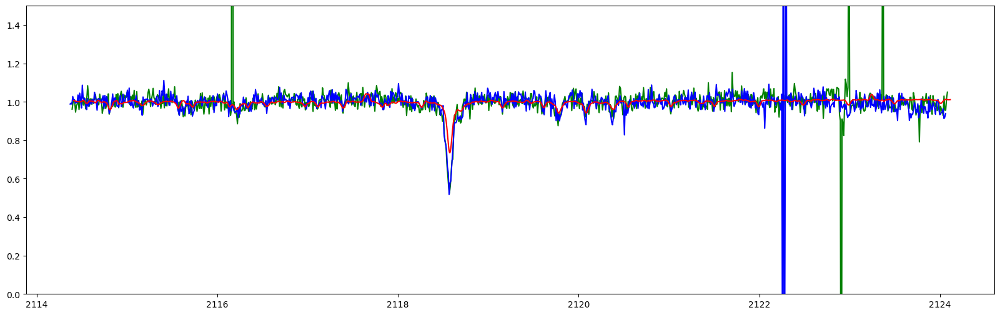

In [1322]:
plt.figure(figsize=(20,6))
plt.plot(lamb_A, normalized_nod_A, color="g",label='NOD A')
plt.plot(lamb_B, normalized_nod_B, color='b', label='NOD B')
plt.plot(cut_lambda, spirou,color="r", label='SPIROU')
plt.ylim(0,1.5)
#plt.xlim(2120,2124)

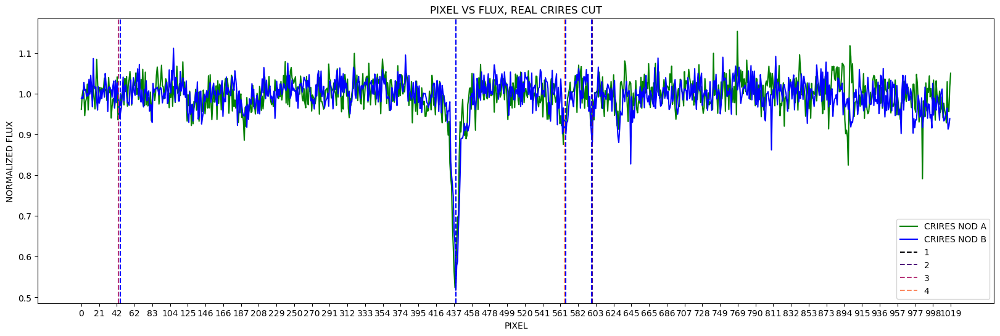

In [1323]:
plt.figure(figsize=(20,6))
plt.plot(pixel_nodA, f_normalized_nod_A, color='g',label='CRIRES NOD A')
plt.plot(pixel_nodB, f_normalized_nod_B, color='b',label='CRIRES NOD B')
plt.xlabel('PIXEL')
plt.ylabel('NORMALIZED FLUX')
plt.title('PIXEL VS FLUX, REAL CRIRES CUT')
plt.xticks(np.linspace(pixel_nodA.min(), pixel_nodA.max(), num=50)) 
plt.legend()

for i in range(len(centre_peaka_pixel_c)):
    color = cm.magma(i / len(centre_peaka_pixel_c)) 
    plt.axvline(centre_peaka_pixel_c[i],linestyle="dashed",color=color,label=i+1)
    plt.legend()
    #plt.axvline(guess[i],linestyle="dashed",color="g")
    plt.axvline(centre_peakb_pixel_c[i],linestyle="dashed",color='b')

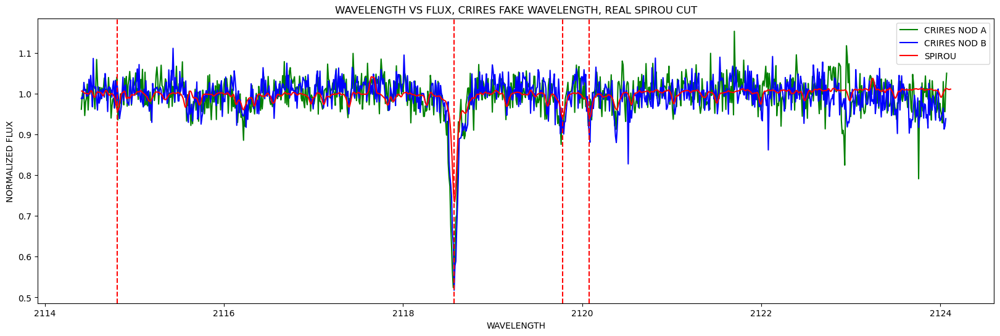

In [1324]:
#all plotted in wavelength to see the peaks
#this plot to cut spirou 
#and to see if cut lines match up with calculating crires to nm simply

plt.figure(figsize=(20,6))
plt.plot(nm_nodA, f_normalized_nod_A, color='g', label='CRIRES NOD A')
plt.plot(nm_nodB, f_normalized_nod_B, color='b', label='CRIRES NOD B')
plt.plot(cut_lambda, spirou,color="r", label='SPIROU')

#plt.plot(wavelengths, normalized, color ='r', label='SPIROU')
#plt.xlim(2114,2124)
#plt.ylim(0,1.5)

plt.xlabel('WAVELENGTH')
plt.ylabel('NORMALIZED FLUX')
plt.title('WAVELENGTH VS FLUX, CRIRES FAKE WAVELENGTH, REAL SPIROU CUT')
plt.legend()

for i in range(len(centre_peak_nm_spirou)):
    plt.axvline(centre_peak_nm_spirou[i],linestyle="dashed",color="r")
    #plt.axvline(guess[i],linestyle="dashed",color="g")

In [1325]:
#peaks that did not work:
#np.array((220,230))
#70-100
#650-680

In [1326]:
#define the intervals with the 1d spectra

intervalls_crires = [np.array((420,500)),np.array((580,620)),np.array((30,80)),np.array((550,580))]
#intervalls_spirou = [np.array((2118.4,2118.8)),np.array((2120,2120.5)), np.array((2114.5,2115))]

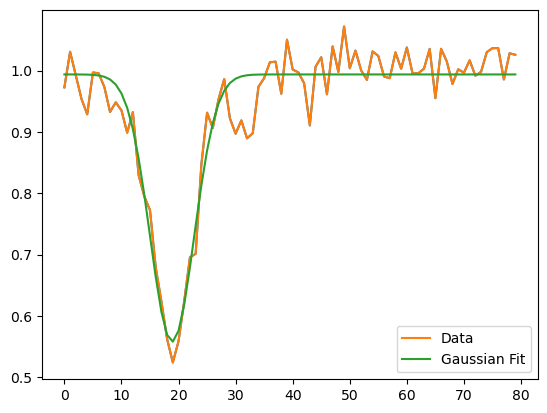

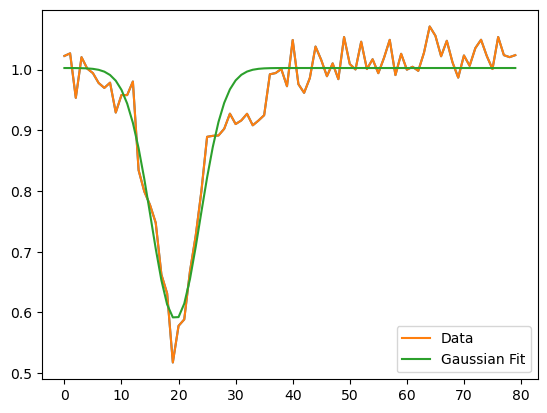

Peak Crires NOD A :
Mu NOD A: 18.87774853759026
Error of Mu NOD A: 0.1798602777500376
Peak Crires NOD B :
Mu NOD B: 19.478607592220392
Error of Mu NOD B : 0.19843463169614528
Centre of Peak (Crires NOD A) in pixel: 438.87774853759026
Centre of Peak (Crires NOD B) in pixel: 439.4786075922204
Centre of Peak guess (Crires NOD A) in nm: 2118.568481146286


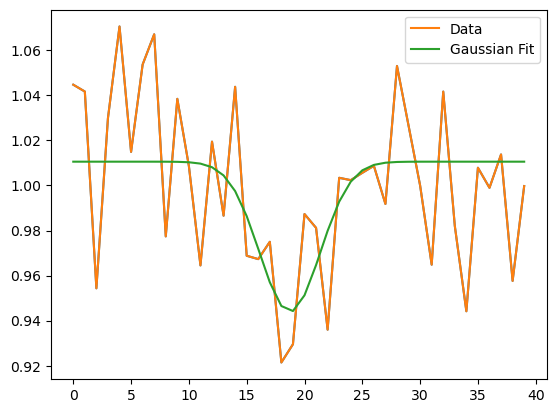

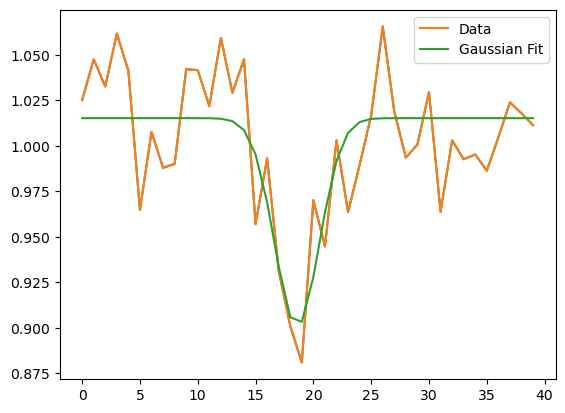

Peak Crires NOD A :
Mu NOD A: 18.734690467433232
Error of Mu NOD A: 0.858696078673818
Peak Crires NOD B :
Mu NOD B: 18.5847968181047
Error of Mu NOD B : 0.3639369846034387
Centre of Peak (Crires NOD A) in pixel: 598.7346904674332
Centre of Peak (Crires NOD B) in pixel: 598.5847968181047
Centre of Peak guess (Crires NOD A) in nm: 2120.084624329902


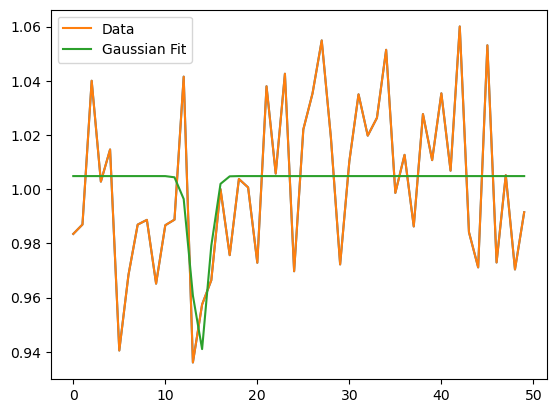

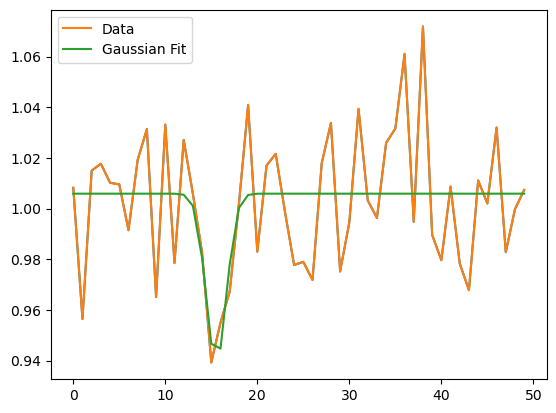

Peak Crires NOD A :
Mu NOD A: 13.789020895374483
Error of Mu NOD A: 0.4440926363338752
Peak Crires NOD B :
Mu NOD B: 15.53873247971954
Error of Mu NOD B : 0.41956153135323737
Centre of Peak (Crires NOD A) in pixel: 43.789020895374485
Centre of Peak (Crires NOD B) in pixel: 45.53873247971954
Centre of Peak guess (Crires NOD A) in nm: 2114.8213114950545


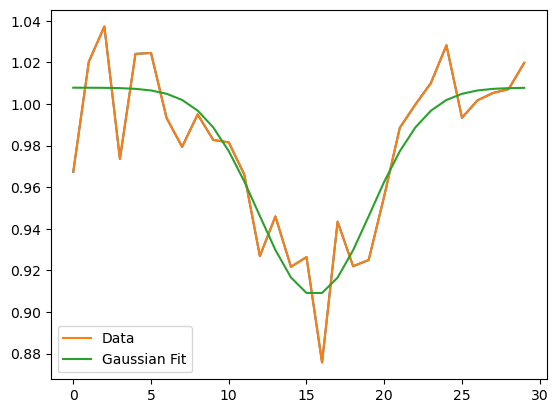

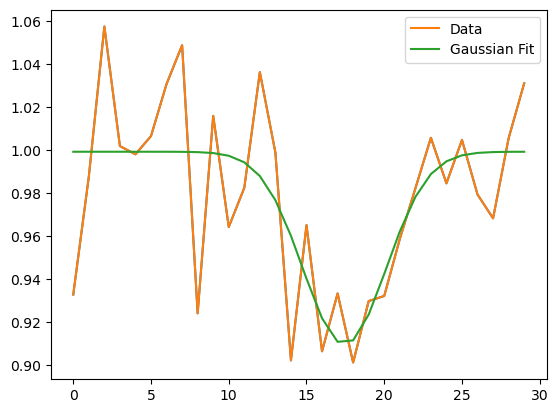

Peak Crires NOD A :
Mu NOD A: 15.502807315982027
Error of Mu NOD A: 0.39342944065669344
Peak Crires NOD B :
Mu NOD B: 17.445871533404418
Error of Mu NOD B : 0.6501397536145479
Centre of Peak (Crires NOD A) in pixel: 565.5028073159821
Centre of Peak (Crires NOD B) in pixel: 567.4458715334044
Centre of Peak guess (Crires NOD A) in nm: 2119.7694406881374


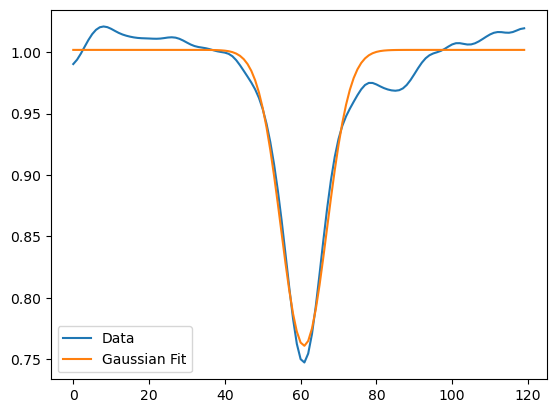

Peak Spirou:
Mu as index of cut: 60.89785786795251
Error of Mu as index: 0.15038525187077628
Centre of Peak Spirou in nm: 2118.569999998951


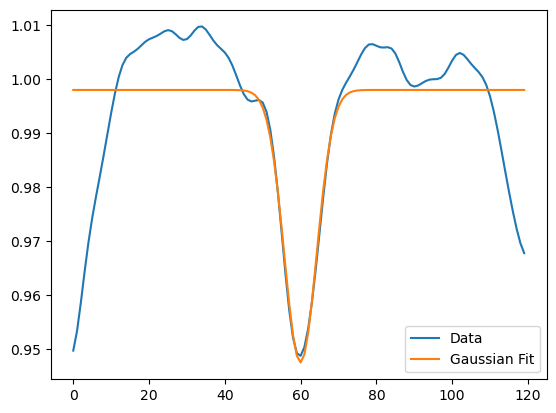

Peak Spirou:
Mu as index of cut: 59.95510205143017
Error of Mu as index: 0.5173194322503121
Centre of Peak Spirou in nm: 2120.0799999989495


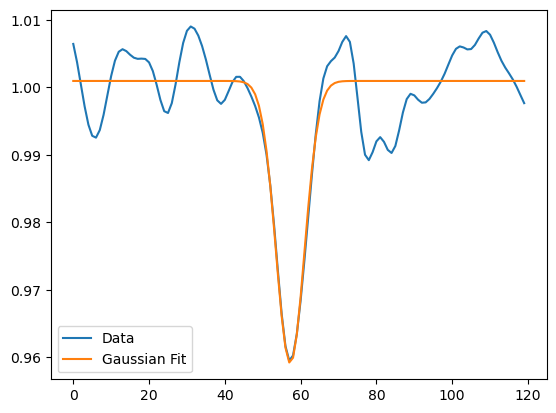

Peak Spirou:
Mu as index of cut: 57.262070006014284
Error of Mu as index: 0.2329685686626081
Centre of Peak Spirou in nm: 2114.8099999989545


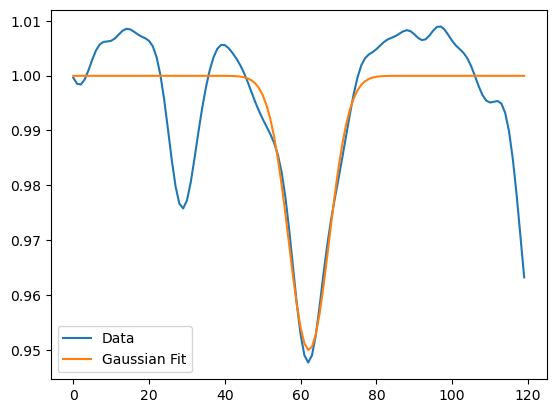

Peak Spirou:
Mu as index of cut: 62.18176189403827
Error of Mu as index: 0.4238925764647696
Centre of Peak Spirou in nm: 2119.7799999989497
polyfit function for NOD A:             2
-9.529e-08 x + 0.009569 x + 2114
error of the fit function for NOD A: [2.06495434e-07 1.30212680e-04 1.34709745e-02]
polyfit function for NOD B:             2
-1.108e-07 x + 0.009596 x + 2114
error of the fit function for NOD B: [7.52264573e-08 4.76170650e-05 4.94491835e-03]
errors of gaussian peaks nod a: [0.1798602777500376, 0.858696078673818, 0.4440926363338752, 0.39342944065669344]
errors of gaussian peaks nod b: [0.19843463169614528, 0.3639369846034387, 0.41956153135323737, 0.6501397536145479]
errors of gaussian peaks spirou: [0.15038525187077628, 0.5173194322503121, 0.2329685686626081, 0.4238925764647696]


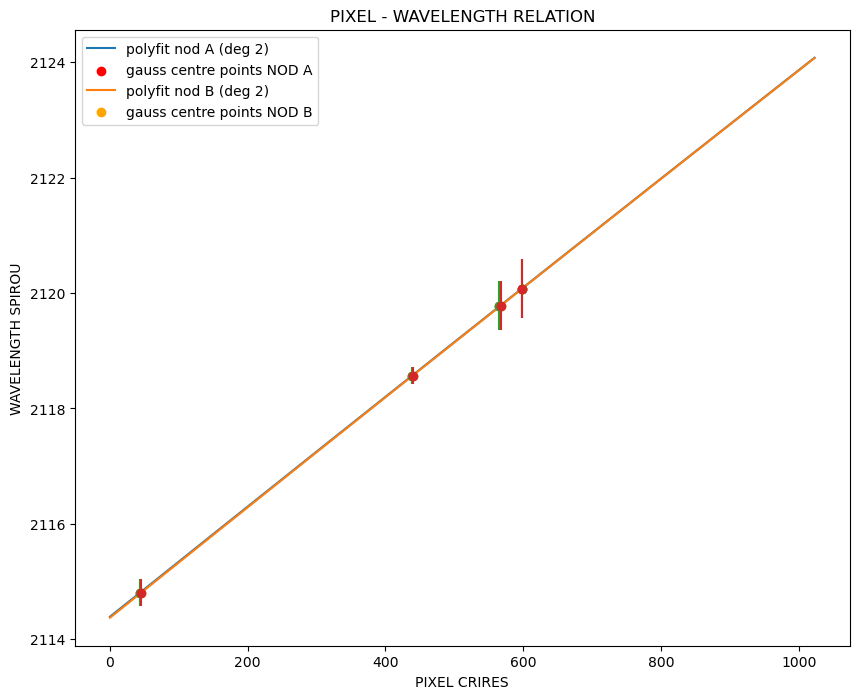

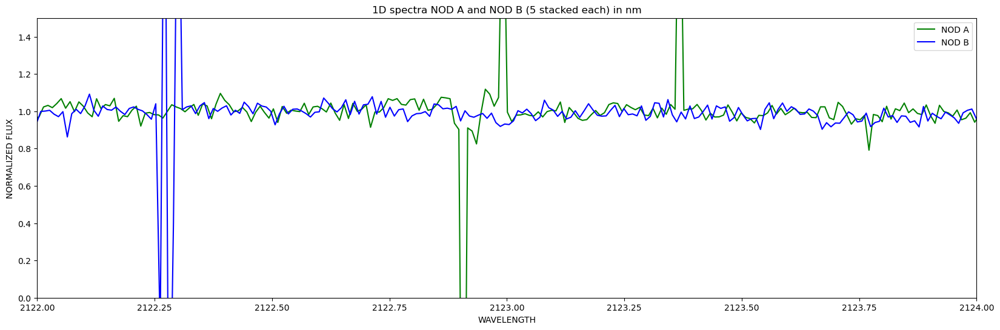

In [1327]:
#run the wavelength calibration
centre_peaka_pixel_c, centre_peakb_pixel_c, centre_peak_nm_spirou,lamb_A,lamb_B = wave_cali(intervalls_crires,normalized_nod_A,normalized_nod_B,wavelength,normalized)

In [1328]:
print(centre_peaka_pixel_c)
print(centre_peakb_pixel_c)
print(centre_peak_nm_spirou)
print(guess)

[438.87774853759026, 598.7346904674332, 43.789020895374485, 565.5028073159821]
[439.4786075922204, 598.5847968181047, 45.53873247971954, 567.4458715334044]
[2118.569999998951, 2120.0799999989495, 2114.8099999989545, 2119.7799999989497]
[2118.570986036351, 2120.084775035096, 2114.8209173397245, 2120.390605570776, 2119.777638368904]


In [1329]:
x_fit_A #pixel values nod a 
lamb_A = p_A(x_fit_A) #lambda values nod a 

x_fit_B #pixel values nod b 
lamb_B = p_B(x_fit_B) #lambda values nod a 

In [1330]:
#comparison nod a and nod b

In [1331]:
diff = lamb_A - lamb_B
print(diff)

[0.02192842 0.02185598 0.02178367 ... 0.01936883 0.0194364  0.0195041 ]


In [1332]:
#plt.figure(figsize=(20,8))
#plt.plot(x_fit_A,lamb_A, label='NOD A')
#plt.plot(x_fit_B,lamb_B, label='NOD B')
#plt.xlabel('PIXEL CRIRES')
#plt.ylabel('WAVELENGTH SPIROU')
#plt.title('PIXEL WAVELENGTH RELATION FOR BOTH NODS')
#plt.legend()

In [1333]:
#DISPLACEMENT IN SCIENCE (HST10)

In [1334]:
hst_unsorted = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS','EXPTIME'], grepping=['HST10'])
dfitspy.dfitsort_view(hst_unsorted)

             filename             	EXPTIME	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-------	-----------------------	--------------	------
CRIRE.2012-03-16T00:32:38.850.fits	 180.0 	           B           	56002.02267188	HST10 
CRIRE.2012-03-16T00:18:55.191.fits	 180.0 	           A           	56002.01313879	HST10 
CRIRE.2012-03-16T00:25:52.974.fits	 180.0 	           B           	56002.01797424	HST10 
CRIRE.2012-03-16T00:53:15.863.fits	 180.0 	           A           	56002.03698916	HST10 
CRIRE.2012-03-16T00:12:06.568.fits	 180.0 	           A           	56002.00840935	HST10 
CRIRE.2012-03-16T00:39:27.473.fits	 180.0 	           B           	56002.02740131	HST10 
CRIRE.2012-03-16T01:00:03.573.fits	 180.0 	           A           	56002.04170802	HST10 


In [1335]:
#sorted them by MJB-OBS
data = pd.DataFrame.from_dict(hst_unsorted, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
hst = data.to_dict() 
dfitspy.dfitsort_view(hst)

             filename             	EXPTIME	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-------	-----------------------	--------------	------
CRIRE.2012-03-16T00:12:06.568.fits	 180.0 	           A           	56002.00840935	HST10 
CRIRE.2012-03-16T00:18:55.191.fits	 180.0 	           A           	56002.01313879	HST10 
CRIRE.2012-03-16T00:25:52.974.fits	 180.0 	           B           	56002.01797424	HST10 
CRIRE.2012-03-16T00:32:38.850.fits	 180.0 	           B           	56002.02267188	HST10 
CRIRE.2012-03-16T00:39:27.473.fits	 180.0 	           B           	56002.02740131	HST10 
CRIRE.2012-03-16T00:53:15.863.fits	 180.0 	           A           	56002.03698916	HST10 
CRIRE.2012-03-16T01:00:03.573.fits	 180.0 	           A           	56002.04170802	HST10 


In [1477]:
hst_nodA_unsorted = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS'], grepping=['HST10','A']) 

#sorting NOD A in order of observation time
data = pd.DataFrame.from_dict(hst_nodA_unsorted, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
hst_nodA = data.to_dict() 
dfitspy.dfitsort_view(hst_nodA)
list_hst_A = list(hst_nodA)

             filename             	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-----------------------	--------------	------
CRIRE.2012-03-16T00:12:06.568.fits	           A           	56002.00840935	HST10 
CRIRE.2012-03-16T00:18:55.191.fits	           A           	56002.01313879	HST10 
CRIRE.2012-03-16T00:53:15.863.fits	           A           	56002.03698916	HST10 
CRIRE.2012-03-16T01:00:03.573.fits	           A           	56002.04170802	HST10 


In [1478]:
hst_nodB_unsorted = dfitspy.dfitsort(listfiles, listkeys= ['OBJECT','HIERARCH ESO SEQ NODPOS','MJD-OBS'], grepping=['HST10','B']) 

#sorting NOD A in order of observation time
data = pd.DataFrame.from_dict(hst_nodB_unsorted, orient = 'columns')
data = data.sort_values(by='MJD-OBS',axis=1)
hst_nodB = data.to_dict() 
dfitspy.dfitsort_view(hst_nodB)
list_hst_B = list(hst_nodB)

             filename             	HIERARCH ESO SEQ NODPOS	   MJD-OBS    	OBJECT
----------------------------------	-----------------------	--------------	------
CRIRE.2012-03-16T00:25:52.974.fits	           B           	56002.01797424	HST10 
CRIRE.2012-03-16T00:32:38.850.fits	           B           	56002.02267188	HST10 
CRIRE.2012-03-16T00:39:27.473.fits	           B           	56002.02740131	HST10 


In [1678]:
#1st from hst nod A

file_name="data/CRIRE.2012-03-16T00:12:06.568.fits"
hdul1 = fits.open(file_name)
hdul1.info()

data_A = hdul1[2].data
#print(data_A.shape) #512, 1024
#print(type(data_A)) #NP ARRAY

#plt.plot(data[225,])
#plt.plot(data[:,520])

#image_plot(data_A)
#image_plot_lines(data_A,225,848)

#1st from hst nod B

file_name="data/CRIRE.2012-03-16T00:25:52.974.fits" 
hdul2 = fits.open(file_name)
hdul2.info()

data_B = hdul2[2].data

Filename: data/CRIRE.2012-03-16T00:12:06.568.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     540   ()      
  1  CHIP1.INT1    1 ImageHDU       252   (1024, 512)   float32   
  2  CHIP2.INT1    1 ImageHDU       252   (1024, 512)   float32   
  3  CHIP3.INT1    1 ImageHDU       252   (1024, 512)   float32   
  4  CHIP4.INT1    1 ImageHDU       252   (1024, 512)   float32   
Filename: data/CRIRE.2012-03-16T00:25:52.974.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     540   ()      
  1  CHIP1.INT1    1 ImageHDU       252   (1024, 512)   float32   
  2  CHIP2.INT1    1 ImageHDU       252   (1024, 512)   float32   
  3  CHIP3.INT1    1 ImageHDU       252   (1024, 512)   float32   
  4  CHIP4.INT1    1 ImageHDU       252   (1024, 512)   float32   


In [1342]:
arcsec = np.arange(512)*0.086

In [1680]:
#function that can change the x axis with a giving lambda array from wavelength calibration
def image_unitchange(image_data, lamb, xlabel='WAVELENGTH [NM]'):
    
    fig, ax = plt.subplots(figsize=(20, 10))

    zscale = ZScaleInterval()
    zlims = zscale.get_limits(image_data)
    norm = simple_norm(image_data, min_cut=zlims[0], max_cut=zlims[1])
    
    #extent = [0, len(lamb_A)*2, 0, len(image_data)]
    im = ax.imshow(image_data, origin='lower', norm=norm)#extent=extent)
    plt.colorbar(im)

    X = np.linspace(0, len(lamb)-1, 10, dtype=int)
    x_tick_labels = np.round(lamb[X])
    ax.set_xticks(X) #*2
    ax.set_xticklabels(x_tick_labels)
    
    Y = np.linspace(0, len(image_data)-1,10,dtype = int)
    y_tick_labels = np.round(Y * 0.086, 3)
    ax.set_yticks(Y)
    ax.set_yticklabels(y_tick_labels)

    plt.title('1st HST IMAGE')
    plt.xlabel(xlabel)
    plt.ylabel('POSITION [arcsec]')
    plt.show()

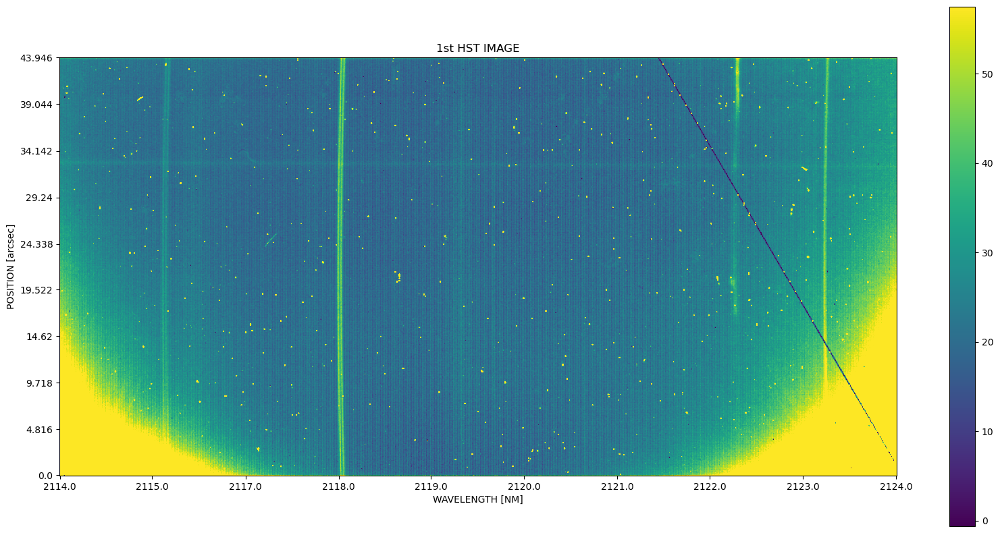

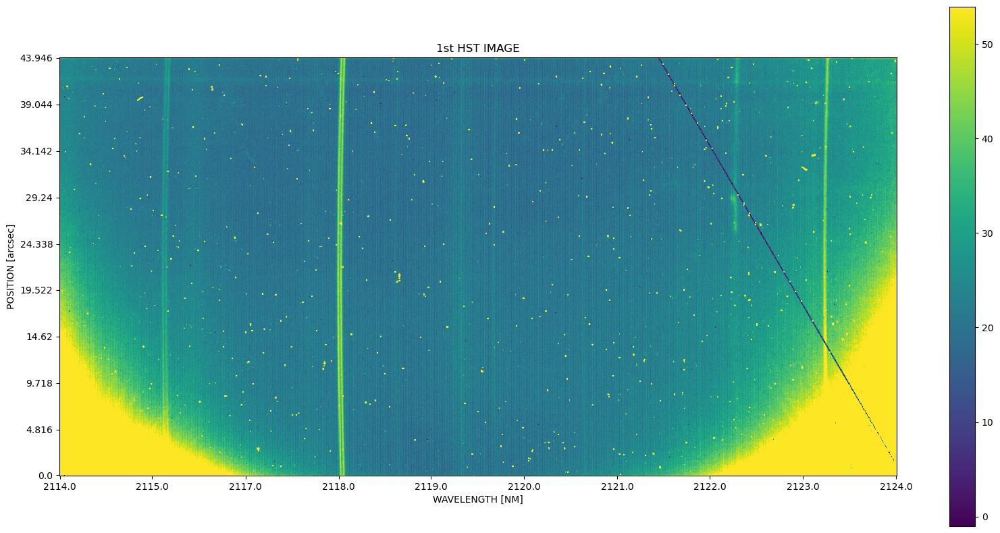

In [1682]:
image_unitchange(data_A,lamb_A,xlabel='WAVELENGTH [NM]')
image_unitchange(data_B,lamb_B,xlabel='WAVELENGTH [NM]')

In [1686]:
#x axis values in velocity

lambda0=2122.20 #lambda0=2121.83 

c = 300000 #km/s
v_A = c * (lamb_A - lambda0)/lambda0 #km/s
print(v_A)
print(len(v_A))

v_B = c * (lamb_B - lambda0)/lambda0 #km/s
print(v_B)
print(len(v_B))

print('V at 823:',v_A[823])
print('Lamb A at 823:',lamb_A[823])

lambda_0_new = c * lamb_A[823] / (v_A[823] + c)
print('NEW:',lambda_0_new)

[-1103.70383658 -1102.35421035 -1101.00460472 ...   263.54174546
   264.8703466    266.19892715]
1024
[-1106.80369831 -1105.44383108 -1104.08400383 ...   260.80371466
   262.12276418   263.44177373]
1024
V at 823: 0.07302408783902155
Lamb A at 823: 2122.200516572397
NEW: 2122.2


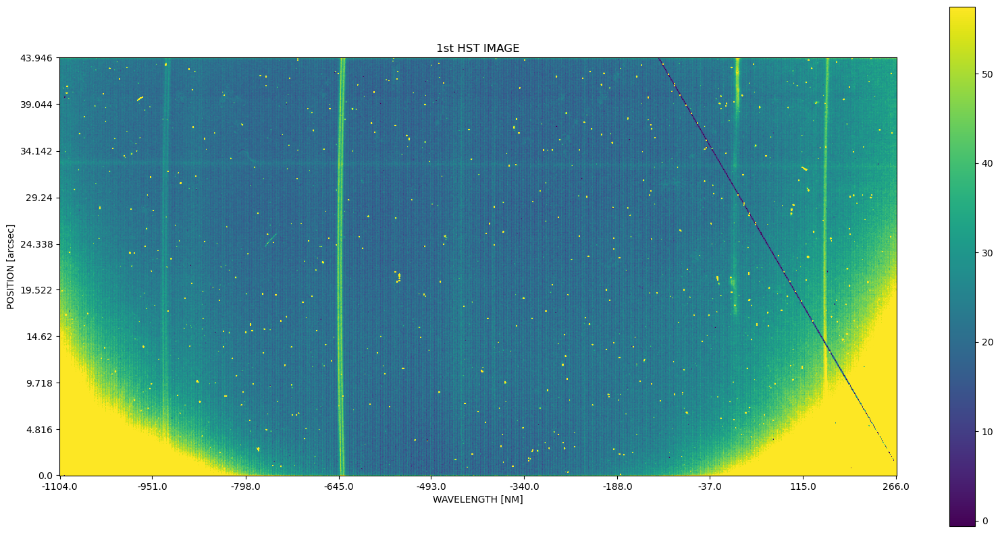

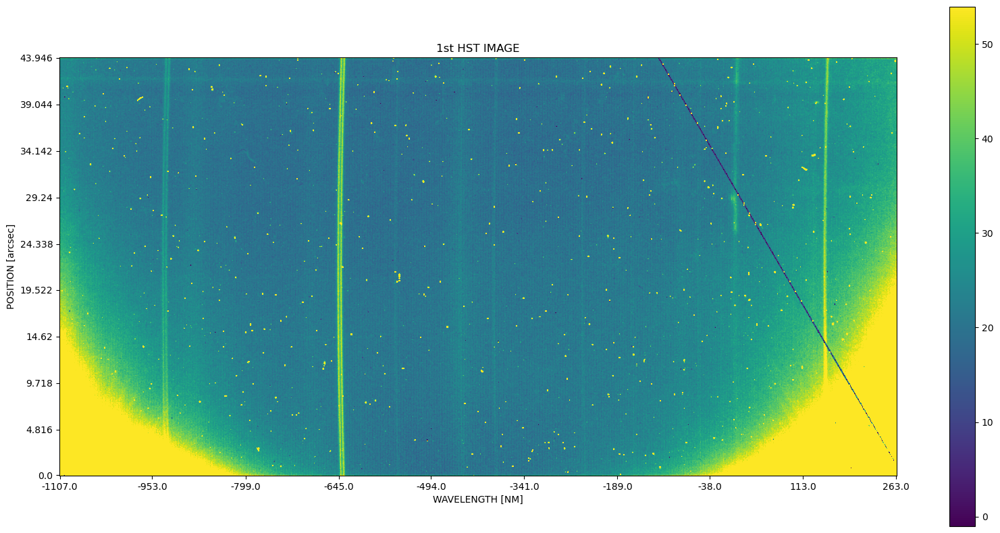

In [1360]:
image_unitchange(data_A,v_A)
image_unitchange(data_B,v_B)

In [999]:
#FINDING THE CENTRE PIXEL FOR ARCSEC ZERO POINT
#y axis values in arcsec 
#0.086” per pixel
#arcsec = length 512 * 0.086


In [1690]:
#rv index closest to 0
index_000a = np.abs(v_A).argmin()
index_000b = np.abs(v_B).argmin()
print('RV index closest to 0 (NOD A):', index_000a)
print('RV index closest to 0 (NOD B):',index_000b)

RV index closest to 0 (NOD A): 823
RV index closest to 0 (NOD B): 824


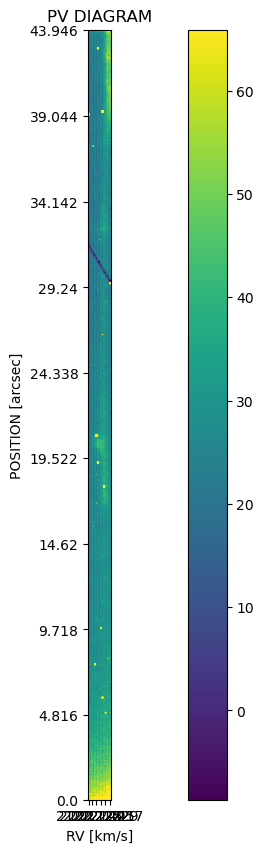

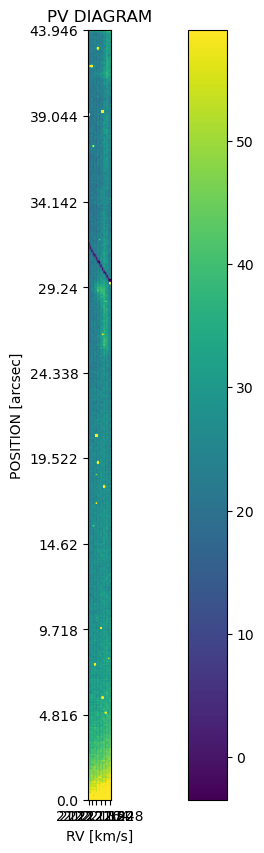

In [1691]:
image_zoom1(data_A[:,815:830],lamb_A[815:830],arcsec)
image_zoom1(data_B[:,815:830],lamb_B[815:830],arcsec)

Text(0, 0.5, 'flux')

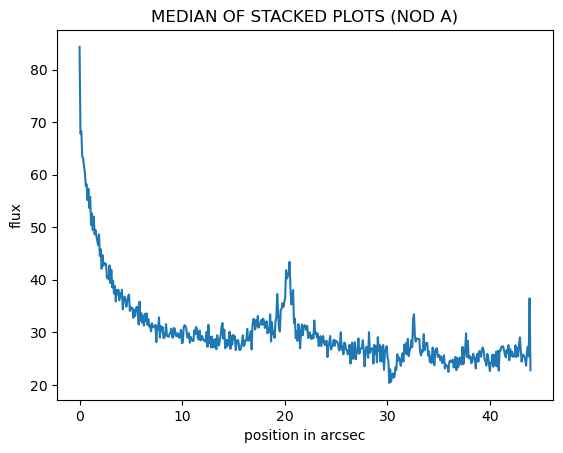

In [1695]:
#plot +3 and -3 around the zero point and stack them
data_collection = []
data_A_cut = data_A[:,820:826] #823 is zero point
x_cut = np.arange(len(data_A_cut)) * 0.086
number = data_A_cut.shape[1] #=0
for i in range(number):
    #plt.plot(x_cut,data_A_cut[:,i])
    #plt.title(str(820 + i)) 
    #plt.show()
    data_collection.append(data_A_cut[:, i])  #collect all the data

stacked_dataA = np.vstack(data_collection) #stack the data
median_dataA = np.median(stacked_data, axis=0) #get the median of all 6 cuts
plt.title('MEDIAN OF STACKED PLOTS (NOD A)')
plt.plot(x_cut, median_dataA)
plt.xlabel('position in arcsec')
plt.ylabel('flux')

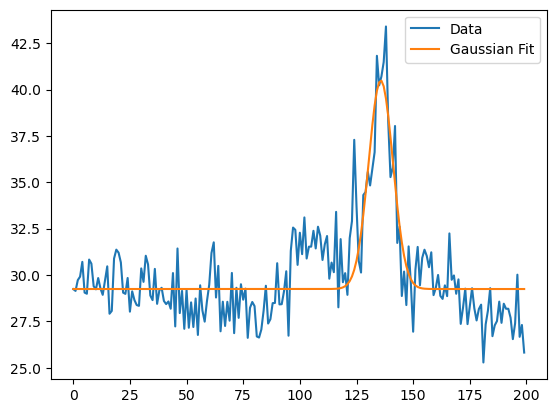

centre in pixel: 235.7161907495063
centre in arcsec: 20.27159240445754


In [1698]:
#get the centre pixel from the stacked data of NOD A
#plt.plot(x_cut, median_data)
peak_A = median_data[100:300]
xxx_A = np.arange(len(peak_A))
mu_AA, sigma_AA, fwhm_AA, d_AA, perr_AA = plot_gaussian_pos(xxx_A,peak_A)

centre_A = mu_AA + 100
centre_arcsec_A = centre_A*0.086
print('centre in pixel:',centre_A)
print('centre in arcsec:', centre_arcsec_A)

Text(0, 0.5, 'flux')

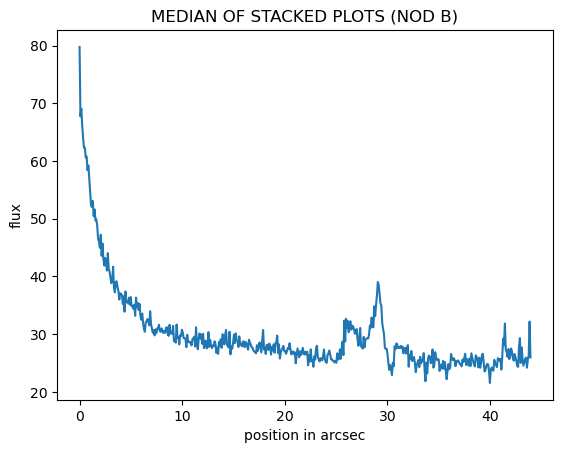

In [1700]:
#same for NOD B
data_collection_B = []
data_B_cut = data_B[:,821:827] #824 is zero point
x_cut_B = np.arange(len(data_B_cut)) * 0.086
numberB = data_B_cut.shape[1] #=0
for i in range(numberB):
    #plt.plot(x_cut_B,data_B_cut[:,i])
    #plt.title(str(821 + i)) 
    #plt.show()
    data_collection_B.append(data_B_cut[:, i])  #collect all the data

stacked_dataB = np.vstack(data_collection_B) #stack the data
median_dataB = np.median(stacked_dataB, axis=0) #get the median of all 6 cuts
plt.title('MEDIAN OF STACKED PLOTS (NOD B)')
plt.plot(x_cut_B, median_dataB)
plt.xlabel('position in arcsec')
plt.ylabel('flux')

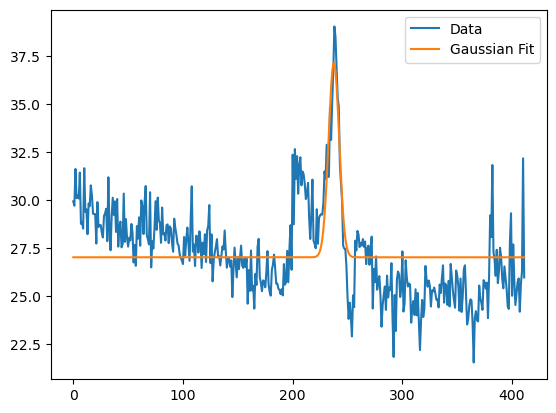

centre in pixel: 337.54142604947197
centre in arcsec: 29.028562640254588


In [1703]:
peak_B = median_dataB[100:]
xxx_B = np.arange(len(peak_B))
mu_BB, sigma_BB, fwhm_BB, d_BB, perr_BB = plot_gaussian_pos(xxx_B,peak_B)

centre_B = mu_BB + 100
centre_arcsec_B = centre_B*0.086
print('centre in pixel:',centre_B)
print('centre in arcsec:', centre_arcsec_B)

In [1071]:
def gaussian_pos(x,  A, mu, sigma,d): 
    return (A * np.exp((-(x - mu)**2) / (2 * sigma**2)) + d)

In [1074]:
def plot_gaussian_pos(xdata, ydata):
    
    popt, pcov = curve_fit(gaussian_pos, xdata, ydata, p0=[max(ydata), np.argmax(ydata), 1, 0],maxfev=10000) 
    
    fit = gaussian_pos(xdata,*popt)
    
    A, mu, sigma, d = popt
    
    plt.plot(xdata, ydata, label='Data')
    plt.plot(xdata, fit, label='Gaussian Fit')
    
    fwhm = 2 * np.sqrt(2 * np.log(2)) * sigma
    
    perr = np.sqrt(np.diag(pcov))

    plt.legend()
    plt.show()
    
    return mu, sigma, fwhm, d, perr

In [1711]:
#shift the zero point for the arcsec axis

in00a = np.where(arcsec == centre_arcsec_A)[0]
print('index where arcsec is centre (NOD A):',in00a)
in000a = np.abs(arcsec - centre_arcsec_A).argmin()
print('closest index where arcsec is centre (NOD A):',in000a)

in00b = np.where(arcsec == centre_arcsec_B)[0]
print('index where arcsec is centre (NOD B):',in00b)
in000b = np.abs(arcsec - centre_arcsec_B).argmin()
print('closest index where arcsec is centre (NOD B):',in000b)


arcsec_firsthalf_A = arcsec[0:in000a]
in11a = len(arcsec) - in000a
arcsec_secondhalf_A = arcsec[1:in11a]

arcsec_firsthalf_B = arcsec[0:in000b]
in11b = len(arcsec) - in000b
arcsec_secondhalf_B = arcsec[1:in11b]

flipped_arr_A = np.max(arcsec_firsthalf_A) + np.min(arcsec_firsthalf_A) - arcsec_firsthalf_A
flipped_arr_B = np.max(arcsec_firsthalf_B) + np.min(arcsec_firsthalf_B) - arcsec_firsthalf_B


arr_A = np.concatenate((-flipped_arr_A, arcsec_secondhalf_A))
print('arr is this long (NOD A):',len(arr_A))

arr_B = np.concatenate((-flipped_arr_B, arcsec_secondhalf_B))
print('arr is this long (NOD B):',len(arr_B))


#zero point verscheieben mit wavelength
print('lambda0:',lambda0)

in22a = np.abs(v_A).argmin()
print('zeropoint index of velo A:',in22a)

in22b = np.abs(v_B).argmin()
print('zeropoint index of velo B:',in22b)



#v_A_firsthalf = v_A[0:823]
#v_A_secondhalf = v_A[1:32]
#print(1024-823)

#print(v_A[815:835])

index where arcsec is centre (NOD A): []
closest index where arcsec is centre (NOD A): 236
index where arcsec is centre (NOD B): []
closest index where arcsec is centre (NOD B): 338
arr is this long (NOD A): 511
arr is this long (NOD B): 511
lambda0: 2122.2
zeropoint index of velo A: 823
zeropoint index of velo B: 824


In [1759]:
def image_zoom1(image_data, velo,arcsec):
    
    fig, ax = plt.subplots(figsize=(20, 10))

    zscale = ZScaleInterval()
    zlims = zscale.get_limits(image_data)
    norm = simple_norm(image_data, min_cut=zlims[0], max_cut=zlims[1])
    
    #extent = [0, len(lamb_A)*2, 0, len(image_data)]
    im = ax.imshow(image_data, origin='lower', norm=norm)#extent=extent)
    plt.colorbar(im)

    X = np.linspace(0, len(velo)-1, 6, dtype=int) #X = np.linspace(-100,100,21,dtype=int)
    ax.set_xticks(X) #*2
    ax.set_xticklabels(np.round(velo[X].astype(float),3))
    print(X)
    
    Y = np.linspace(0, len(arcsec)-1,10,dtype = int)
    y_tick_labels = np.round(Y * 0.086, 2)
    ax.set_yticks(Y)
    ax.set_yticklabels(np.round(arcsec[Y].astype(float),3))
    ax.set_ylim(0, len(arcsec)-1)
    
    #zero_x_tick_index = np.abs(velo - 0).argmin()
    #zero_y_tick_index = np.abs(arcsec - 0).argmin()
    #print(zero_x_tick_index)
    #print(zero_y_tick_index)

    #ax.axhline(y=238, color='r', linestyle='--')
    #ax.axvline(x=825, color='r', linestyle='--') 

    plt.title('PV DIAGRAM')
    plt.xlabel('RV [km/s]')
    plt.ylabel('POSITION [arcsec]')
    plt.show()

[   0  204  409  613  818 1023]


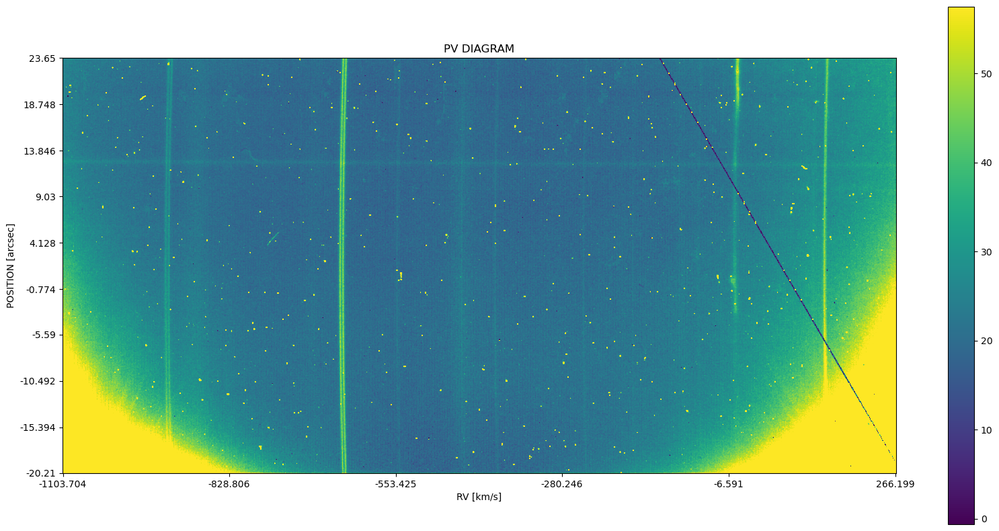

[   0  204  409  613  818 1023]


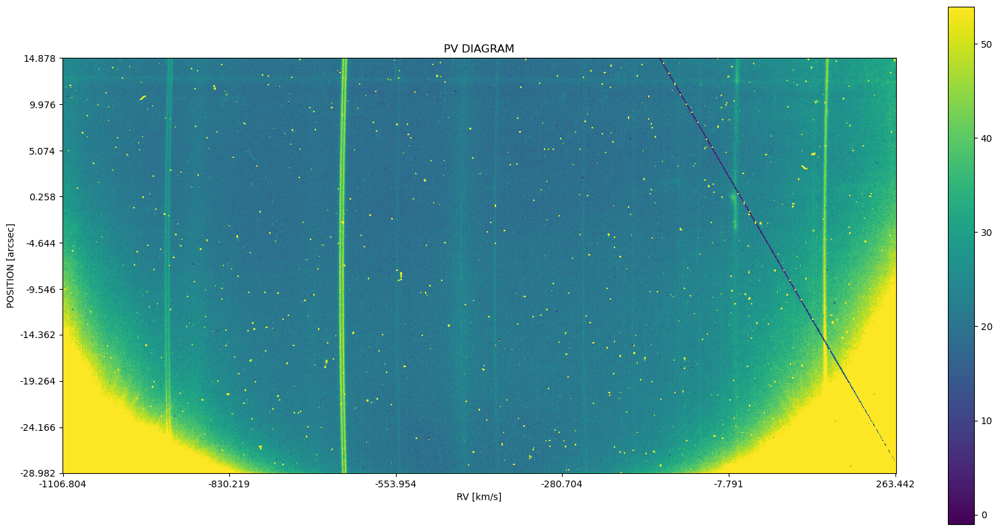

In [1760]:
image_zoom1(data_A,v_A,arr_A)
image_zoom1(data_B,v_B,arr_B)

In [1623]:
#image_zoom1(data_A[220:250,815:835],v_A[815:835],arr[220:250]) #richtiger blob

In [1484]:
#image_zoom(data_B[370:380,870:930],v_B[870:930],arcsec[370:380]) FALSCHER BLOB

In [ ]:
#function for PV diagram:
#input:file_nod_A, masterflat,lamb_A,lambda0,centrepixelds9
#output: PV diagram

In [1750]:
def PV(file,masterflat,lamb,lambda0,centre_pixel,xlimit,ylimit):
    
    hdul = fits.open("data/"+file)
    data_before_fc = hdul[2].data
    
    data = data_before_fc / masterflat
    
    #normal plot:
    #image_plot(data) #image plot with pixel units
    
    #pixel to wavelength on x axis with lambda array:
    #image_unitchange(data,lamb, xlabel='WAVELENGTH [NM]') #image plot with arcsec and wavelength
    
    #---- X AXIS IN RV WITH ZERO POINT AT LAMBDA0 -----
    
    c = 300000 #km/s
    velo = c * (lamb - lambda0)/lambda0 #velocity in km/s
    
    #image_unitchange(data,velo,xlabel='RV [km/s]') #image plot with arcsec and rv
    
    #---- Y AXIS IN ARCSEC WITH ZERO POINT IN CENTRE ----
    #arcsec = np.arange(512) #array with 0.086 arcsec per pix
    
    arr = (centre_pixel - np.arange(512)) * 0.086
    
    #index1 = np.abs(arcsec - centre_pixel).argmin() #index centre 
    #index2 = len(arcsec) - index1 #second half
    
    #arcsec_firsthalf = arcsec[0:index1]
    #arcsec_secondhalf = arcsec[1:index2]
    
    #flipped_arr = np.max(arcsec_firsthalf) + np.min(arcsec_firsthalf) - arcsec_firsthalf

    #arr = np.concatenate((-flipped_arr, arcsec_secondhalf))
    
    image_zoom1(data,velo,arr) #image plot with arcsec and RV 
    
    #----ZOOM TO THE RIGHT VALUES AROUND THE ZERO POINTS ----
    
    index3 = np.abs(velo).argmin()
    velo_new = velo[index3-50:index3+50]
    
    #print(index3) = 823
    #print(len(velo_new)) = 100
    
    index4 = np.abs(arr).argmin()
    arr_new = arr[index4-50:index4+50]
    
    #print(index4) = 238
    #print(len(arr_new)) = 100
    
    data_new = data[index4-50:index4+50,index3-50:index3+50]
    
    image_zoom1(data_new,velo_new,arr_new)

In [1751]:
print(data_AA)

CRIRE.2012-03-16T00:12:06.568.fits


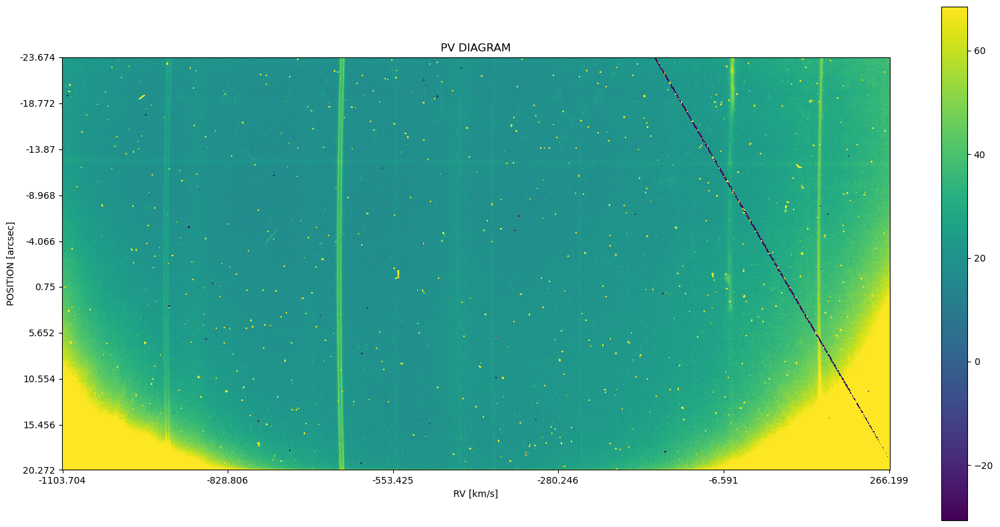

512
1024
[ 20.2715924  20.1855924  20.0995924  20.0135924  19.9275924  19.8415924
  19.7555924  19.6695924  19.5835924  19.4975924  19.4115924  19.3255924
  19.2395924  19.1535924  19.0675924  18.9815924  18.8955924  18.8095924
  18.7235924  18.6375924  18.5515924  18.4655924  18.3795924  18.2935924
  18.2075924  18.1215924  18.0355924  17.9495924  17.8635924  17.7775924
  17.6915924  17.6055924  17.5195924  17.4335924  17.3475924  17.2615924
  17.1755924  17.0895924  17.0035924  16.9175924  16.8315924  16.7455924
  16.6595924  16.5735924  16.4875924  16.4015924  16.3155924  16.2295924
  16.1435924  16.0575924  15.9715924  15.8855924  15.7995924  15.7135924
  15.6275924  15.5415924  15.4555924  15.3695924  15.2835924  15.1975924
  15.1115924  15.0255924  14.9395924  14.8535924  14.7675924  14.6815924
  14.5955924  14.5095924  14.4235924  14.3375924  14.2515924  14.1655924
  14.0795924  13.9935924  13.9075924  13.8215924  13.7355924  13.6495924
  13.5635924  13.4775924  13.3915924  13.3

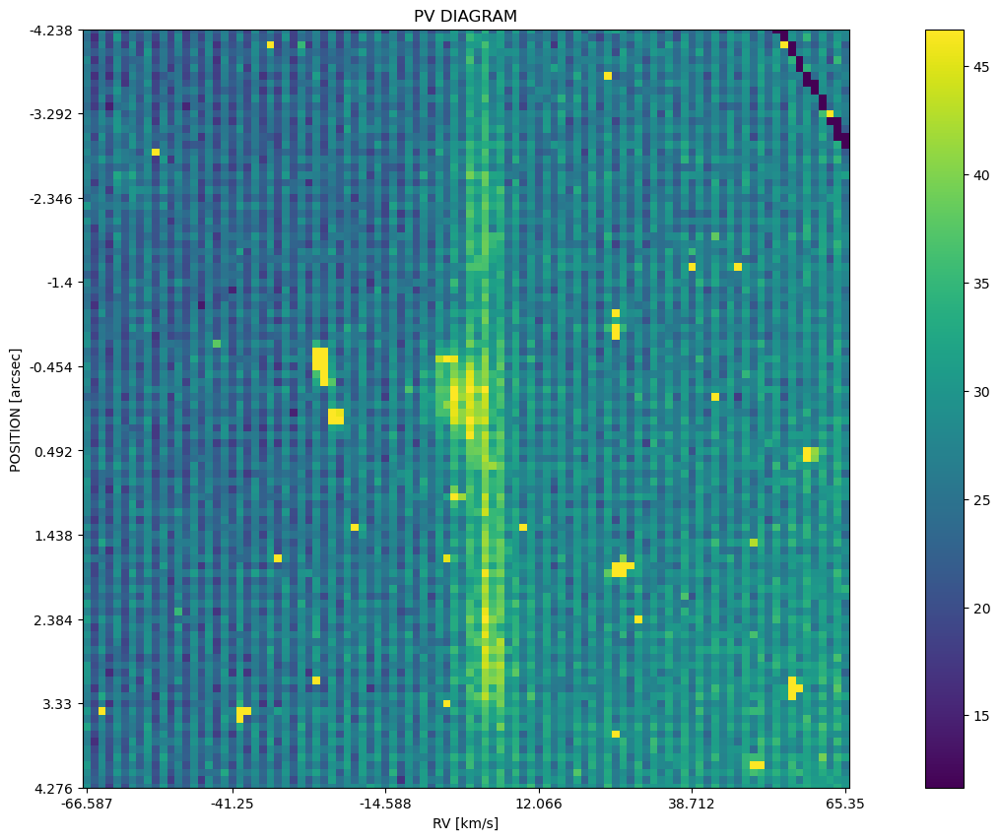

In [1754]:
data_AA = list_hst_A[0] #list_A[i] any from the list_hst_A
masterflat = masterflat #done before
lamb_A #array from wavelength cali
lambda0 = 2122.2
centre_pixel = centre_A

PV(data_AA,masterflat,lamb_A,lambda0,centre_pixel)

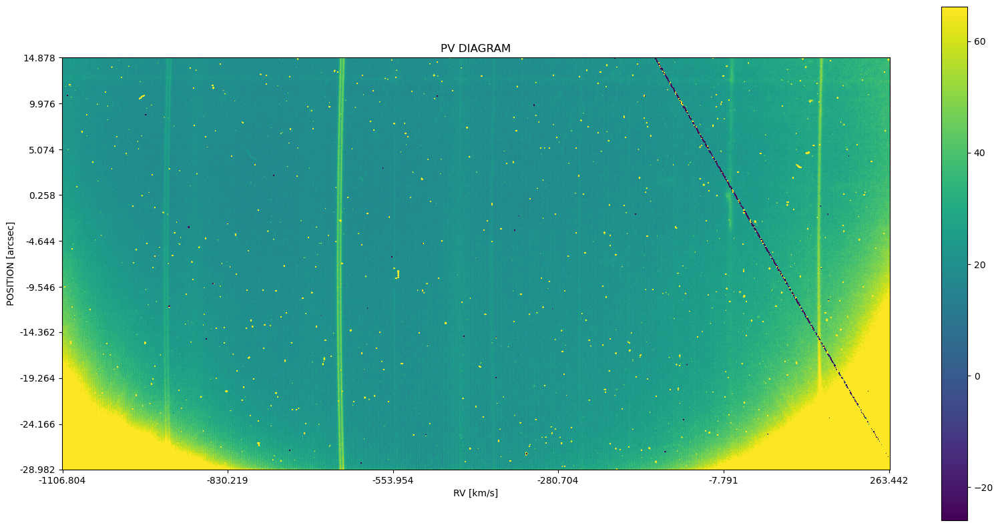

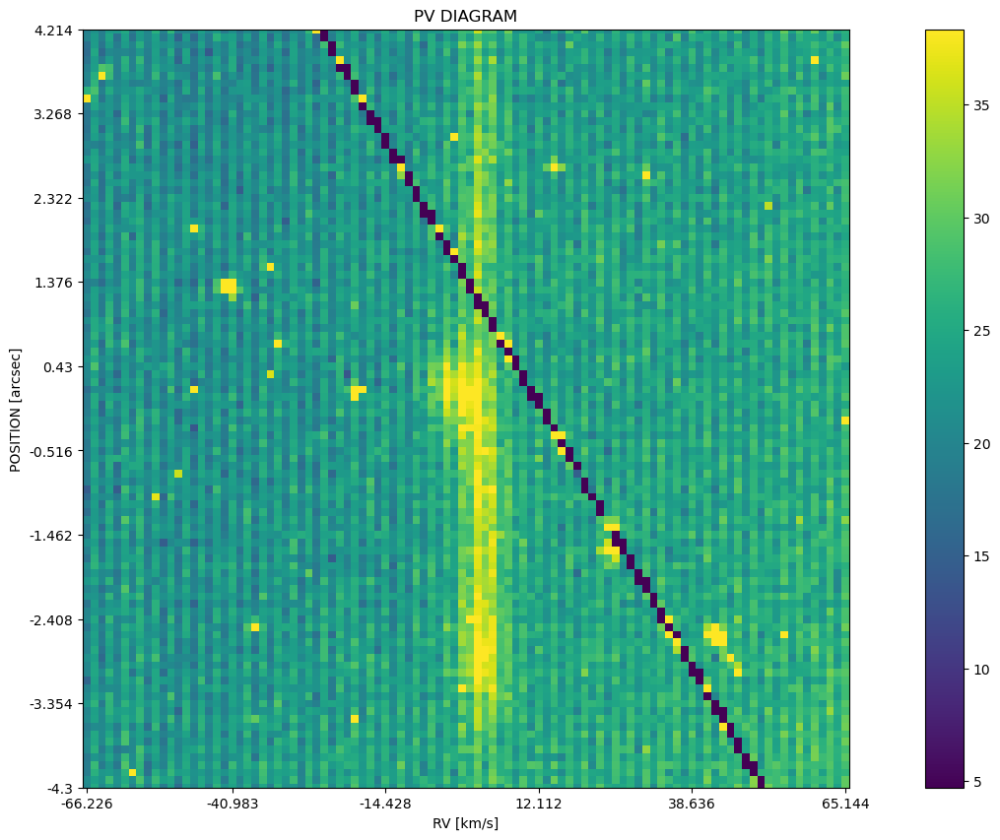

In [1714]:
data_BB = list_hst_B[0] #list_B[i] any from the list_hst_B
masterflat = masterflat #done before
lamb_B #array from wavelength cali
lambda0 = 2122.2
centre_pixel = centre_arcsec_B

PV(data_BB,masterflat,lamb_B,lambda0,centre_pixel)

1024
823
17786.0


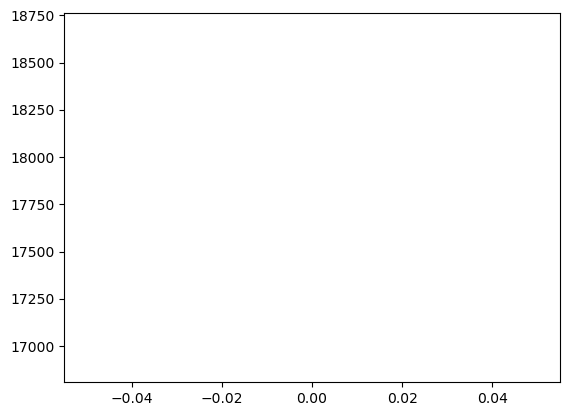

In [1743]:
c = 300000 #km/s
veloo = c * (lamb_A - lambda0)/lambda0 #velocity in km/s
indexx = np.abs(veloo).argmin()
flux_1d = np.sum(dataAA[:,indexx])

plt.plot(flux_1d)
print(len(veloo))
print(indexx)
print(flux_1d)

In [ ]:
#new wavlength cali

#1
#take wave data 
#extract 1d spectra with ap_extract

#2
#take wave data
#extract 1d spectra like in screenshot

#3
#old wave cali

#4
#take blob data
#extract 1d spectra like in screenshoot

#plot 1 2 3 4 over each other
#x axis: lambda 
#y axis: normalized flux

#see if there are differences

In [ ]:
#get new data
#